In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

/home/ubuntu/anaconda3/envs/retrieval/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


# Generator

In [4]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            torch.nn.Linear(hidden_dim * 8, im_dim),
            torch.nn.Sigmoid()
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [5]:
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


# Noise

In [6]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, z_dim).to(device)

In [7]:
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


# Discriminator

In [8]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        
        torch.nn.Linear(input_dim, output_dim),
        torch.nn.LeakyReLU(negative_slope=0.2)
        
    )

In [9]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5
    
    assert str(block.__getitem__(0)).replace(' ', '') == f'Linear(in_features={in_features},out_features={out_features},bias=True)'        
    assert str(block.__getitem__(1)).replace(' ', '').replace(',inplace=True', '') == 'LeakyReLU(negative_slope=0.2)'


test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


In [10]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            torch.nn.Linear(hidden_dim, 1),
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [11]:
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


# Train GAN

In [12]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

In [13]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [22]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    
    noise = get_noise(n_samples=num_images, z_dim=z_dim, device=device)
    fake = gen(noise) # (n_samples, z_dim)
    out_disc_fake = disc(fake.detach()) # (n_samples, scalar)
    fake_loss = criterion(out_disc_fake, torch.zeros_like(out_disc_fake))
    
    out_disc_real = disc(real) # (n_samples, scalar)
    real_loss = criterion(out_disc_real, torch.ones_like(out_disc_real))
    
    disc_loss = (fake_loss + real_loss) / 2    
    
    return disc_loss

In [23]:
def test_disc_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [26]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    noise = get_noise(n_samples=num_images, z_dim=z_dim, device=device)
    fake = gen(noise)
    fake_disc = disc(fake)
    gen_loss = criterion(fake_disc, torch.ones_like(fake_disc))    
    
    return gen_loss
def test_gen_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


  6%|▋         | 30/469 [00:00<00:07, 56.39it/s]

Step 500: Generator loss: 1.4530478441715238, discriminator loss: 0.40852004766464217


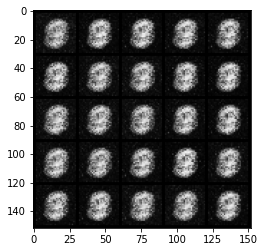

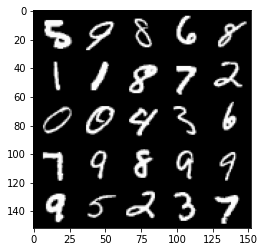

 13%|█▎        | 60/469 [00:01<00:07, 55.39it/s]

Step 1000: Generator loss: 1.8009007740020755, discriminator loss: 0.2673841760456563


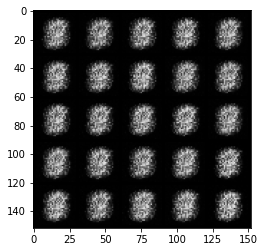

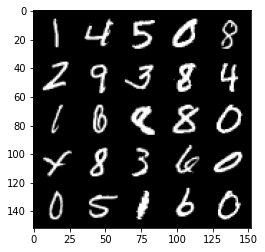

 19%|█▉        | 90/469 [00:01<00:07, 53.27it/s]

Step 1500: Generator loss: 2.0488232252597802, discriminator loss: 0.16299731743335724


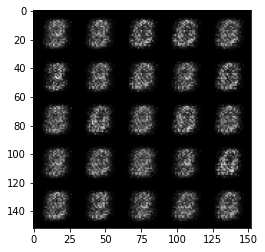

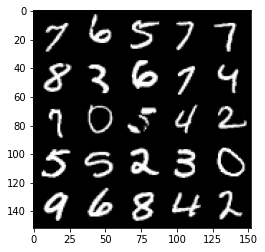

 26%|██▌       | 121/469 [00:02<00:05, 58.03it/s]

Step 2000: Generator loss: 1.67268730545044, discriminator loss: 0.22937119415402416


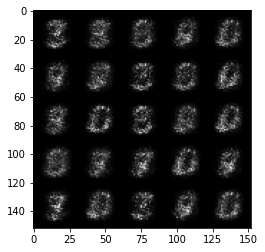

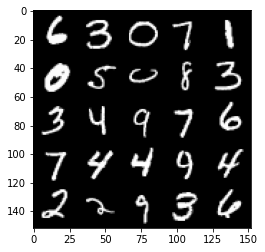

 32%|███▏      | 152/469 [00:02<00:06, 50.98it/s]

Step 2500: Generator loss: 1.5372936015129084, discriminator loss: 0.24308076676726328


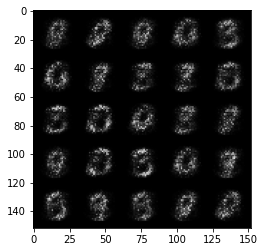

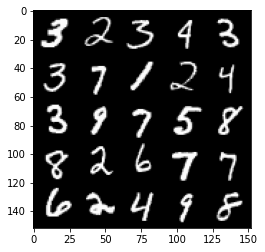

 39%|███▉      | 184/469 [00:03<00:05, 55.41it/s]

Step 3000: Generator loss: 1.8043894133567813, discriminator loss: 0.19054589688777934


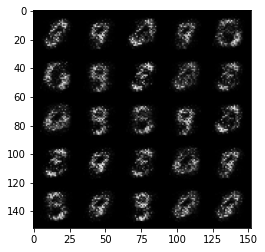

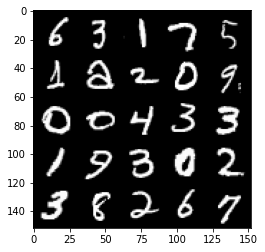

 46%|████▌     | 214/469 [00:03<00:04, 54.91it/s]

Step 3500: Generator loss: 2.309093774318696, discriminator loss: 0.13434905274212358


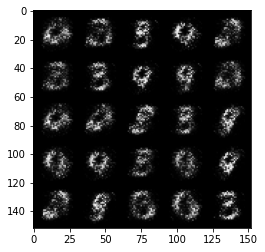

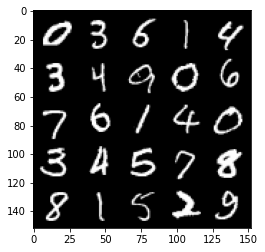

 52%|█████▏    | 246/469 [00:04<00:03, 56.72it/s]

Step 4000: Generator loss: 2.691959289550784, discriminator loss: 0.11234238061308868


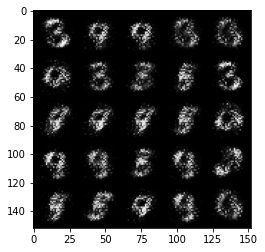

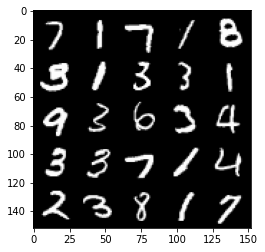

 59%|█████▉    | 277/469 [00:05<00:03, 57.65it/s]

Step 4500: Generator loss: 2.9579370241165153, discriminator loss: 0.09970422689616674


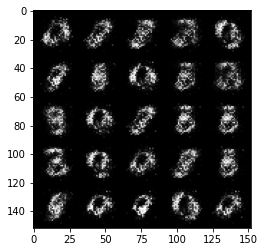

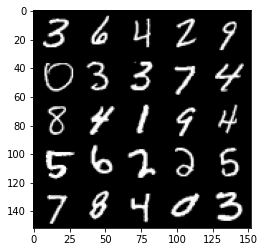

 66%|██████▌   | 310/469 [00:05<00:02, 58.09it/s]

Step 5000: Generator loss: 3.4975784296989456, discriminator loss: 0.09060895541310308


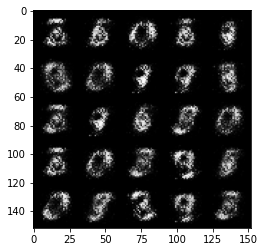

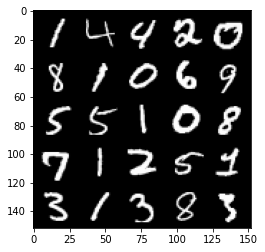

 72%|███████▏  | 336/469 [00:06<00:02, 54.21it/s]

Step 5500: Generator loss: 3.419417150974278, discriminator loss: 0.08295613629370914


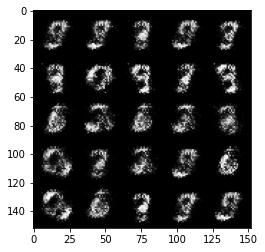

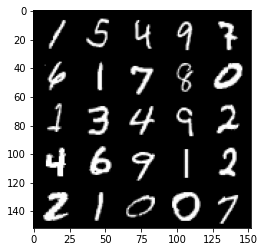

 78%|███████▊  | 367/469 [00:06<00:01, 54.92it/s]

Step 6000: Generator loss: 3.6385621500015266, discriminator loss: 0.07186422151327129


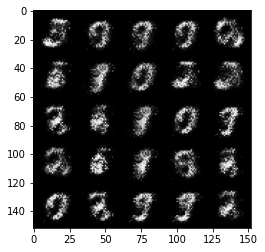

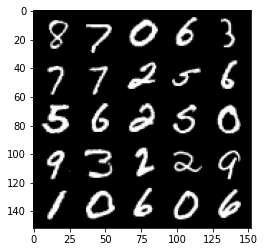

 85%|████████▍ | 397/469 [00:07<00:01, 57.27it/s]

Step 6500: Generator loss: 3.698445721626283, discriminator loss: 0.06550624987483025


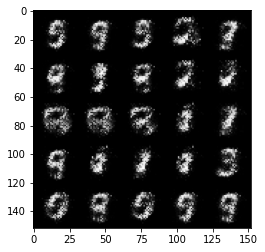

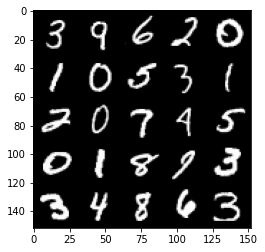

 91%|█████████▏| 429/469 [00:07<00:00, 54.89it/s]

Step 7000: Generator loss: 3.722706785678864, discriminator loss: 0.06963526117801663


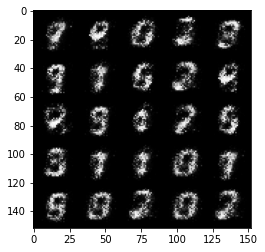

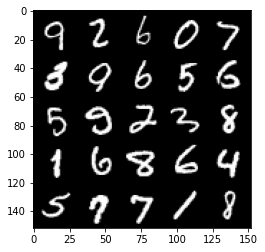

 99%|█████████▊| 463/469 [00:08<00:00, 53.80it/s]

Step 7500: Generator loss: 3.9180274291038533, discriminator loss: 0.05999404504150154


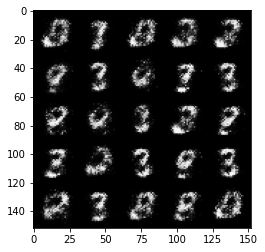

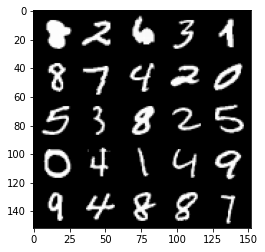

  5%|▌         | 24/469 [00:00<00:08, 52.57it/s]

Step 8000: Generator loss: 3.951450047969822, discriminator loss: 0.05440064841136334


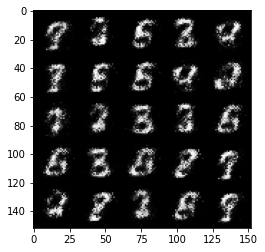

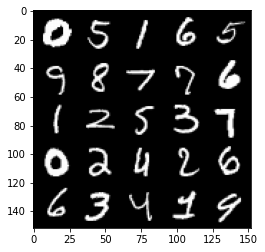

 12%|█▏        | 57/469 [00:00<00:07, 57.29it/s]

Step 8500: Generator loss: 4.134843253612518, discriminator loss: 0.05328033379837871


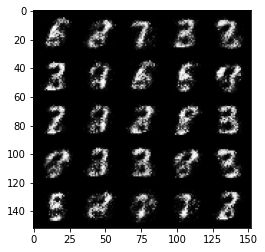

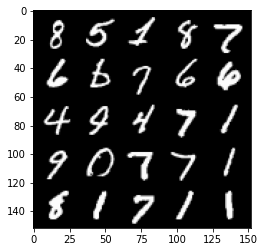

 18%|█▊        | 85/469 [00:01<00:07, 54.50it/s]

Step 9000: Generator loss: 3.9614469285011285, discriminator loss: 0.07059304314851762


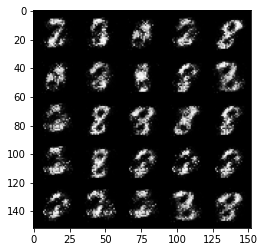

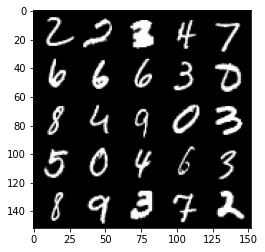

 25%|██▍       | 115/469 [00:02<00:06, 57.30it/s]

Step 9500: Generator loss: 4.060880393981938, discriminator loss: 0.07016624910756948


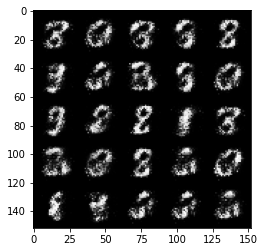

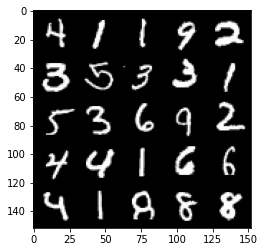

 32%|███▏      | 150/469 [00:02<00:05, 54.25it/s]

Step 10000: Generator loss: 4.048698724269866, discriminator loss: 0.058820436239242546


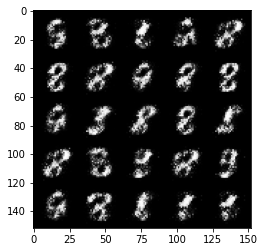

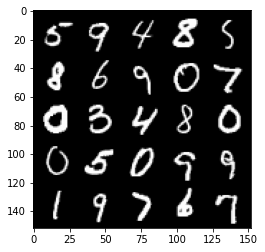

 38%|███▊      | 179/469 [00:03<00:04, 59.67it/s]

Step 10500: Generator loss: 4.091013092517853, discriminator loss: 0.06970726637542243


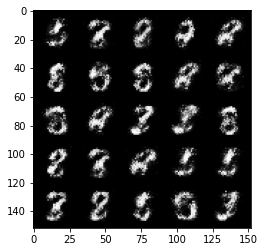

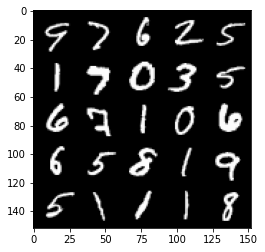

 45%|████▍     | 211/469 [00:03<00:04, 55.68it/s]

Step 11000: Generator loss: 3.948961759567259, discriminator loss: 0.08586586220562459


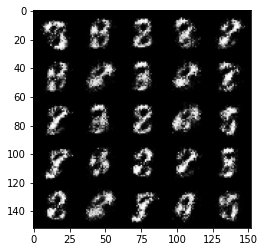

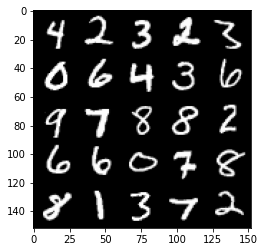

 51%|█████     | 240/469 [00:04<00:04, 55.13it/s]

Step 11500: Generator loss: 3.9802796902656543, discriminator loss: 0.08155759128928185


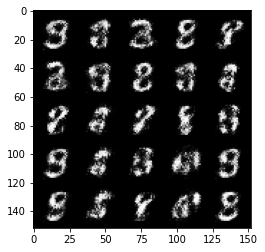

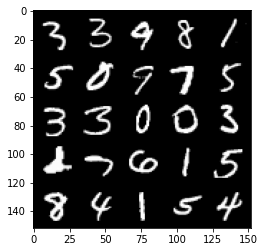

 58%|█████▊    | 273/469 [00:04<00:03, 54.60it/s]

Step 12000: Generator loss: 3.790510279655456, discriminator loss: 0.08955907550454142


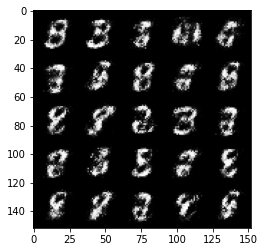

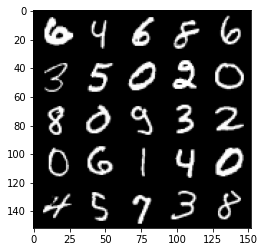

 64%|██████▍   | 301/469 [00:05<00:02, 59.43it/s]

Step 12500: Generator loss: 3.9488141808509805, discriminator loss: 0.08290023718029259


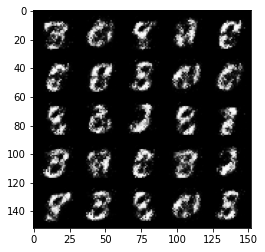

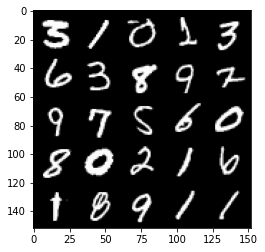

 71%|███████▏  | 335/469 [00:06<00:02, 58.12it/s]

Step 13000: Generator loss: 3.757159543037416, discriminator loss: 0.09666826733946816


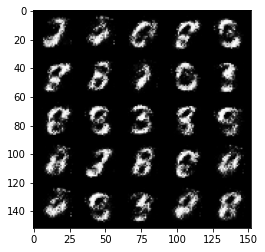

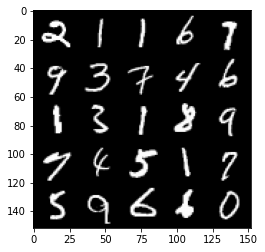

 78%|███████▊  | 365/469 [00:06<00:01, 56.90it/s]

Step 13500: Generator loss: 3.6890256962776182, discriminator loss: 0.10124987458437679


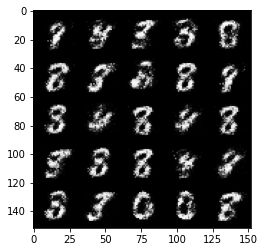

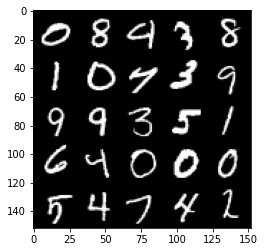

 85%|████████▌ | 399/469 [00:07<00:01, 55.19it/s]

Step 14000: Generator loss: 3.624713232994082, discriminator loss: 0.10631381069123746


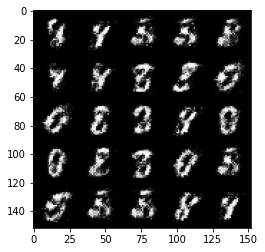

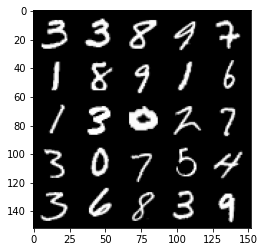

 90%|█████████ | 424/469 [00:07<00:00, 63.61it/s]

Step 14500: Generator loss: 3.8353003640174883, discriminator loss: 0.09523919811844832


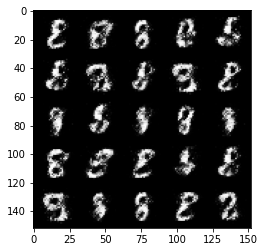

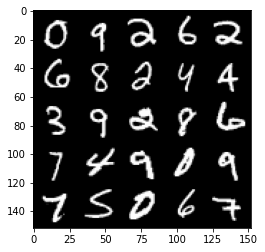

 98%|█████████▊| 458/469 [00:08<00:00, 56.48it/s]

Step 15000: Generator loss: 3.5522240347862235, discriminator loss: 0.10923327427357438


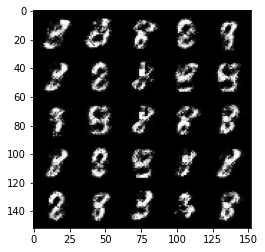

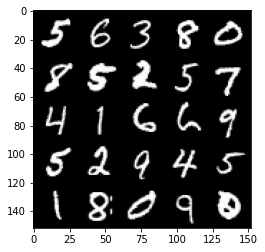

  4%|▍         | 18/469 [00:00<00:08, 55.42it/s]

Step 15500: Generator loss: 3.6996156783104, discriminator loss: 0.09854127568006515


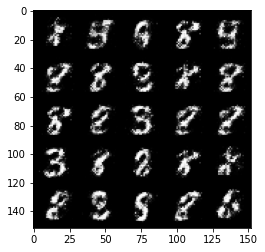

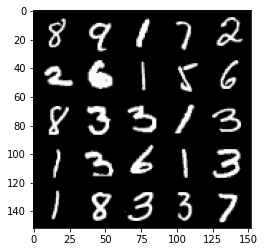

 12%|█▏        | 54/469 [00:00<00:07, 53.93it/s]

Step 16000: Generator loss: 3.6166873788833627, discriminator loss: 0.10545227527618403


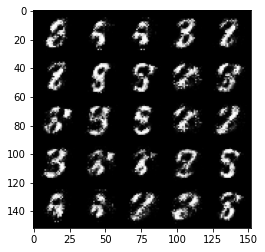

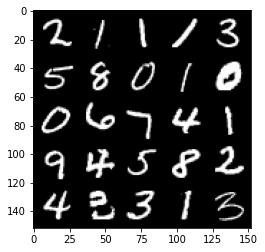

 18%|█▊        | 85/469 [00:01<00:07, 52.49it/s]

Step 16500: Generator loss: 3.542772132873539, discriminator loss: 0.11613289809972044


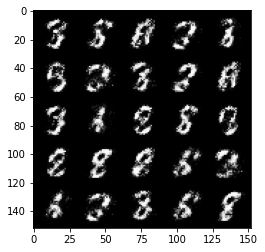

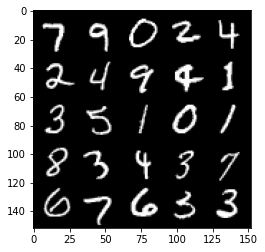

 24%|██▎       | 111/469 [00:01<00:05, 63.51it/s]

Step 17000: Generator loss: 3.4855367956161527, discriminator loss: 0.12679513108730328


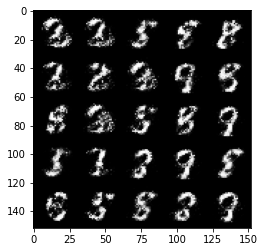

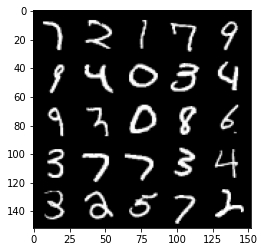

 31%|███       | 144/469 [00:02<00:05, 54.55it/s]

Step 17500: Generator loss: 3.6540353569984463, discriminator loss: 0.12662362283468256


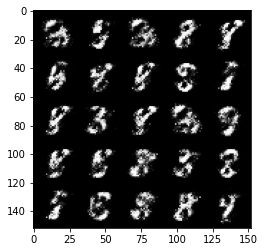

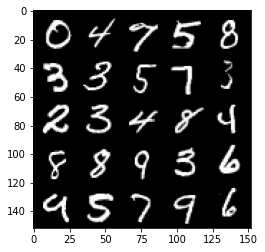

 37%|███▋      | 175/469 [00:03<00:04, 59.51it/s]

Step 18000: Generator loss: 3.4754395227432213, discriminator loss: 0.1463166241645813


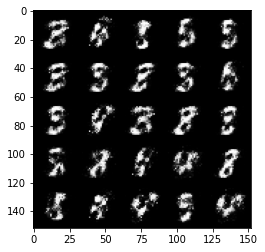

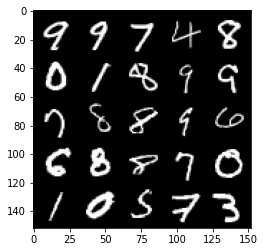

 45%|████▍     | 209/469 [00:03<00:04, 53.78it/s]

Step 18500: Generator loss: 3.268160631656645, discriminator loss: 0.15801324345171458


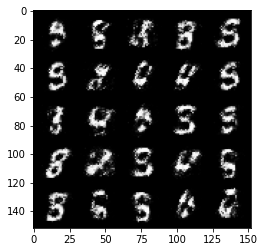

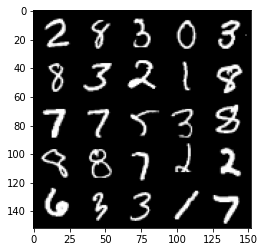

 51%|█████     | 237/469 [00:04<00:04, 57.25it/s]

Step 19000: Generator loss: 3.33789204645157, discriminator loss: 0.15158252429962157


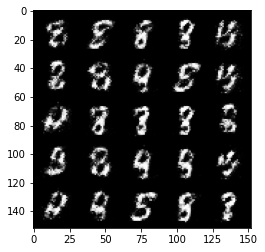

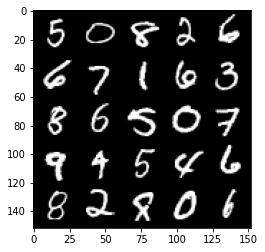

 57%|█████▋    | 268/469 [00:04<00:03, 54.67it/s]

Step 19500: Generator loss: 3.197129268646243, discriminator loss: 0.1676126660406589


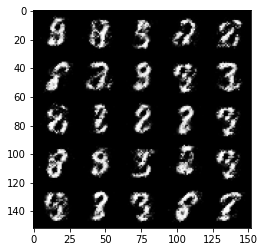

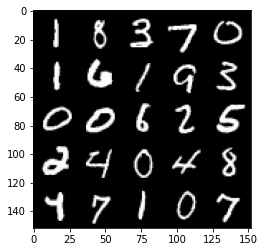

 64%|██████▍   | 299/469 [00:05<00:03, 55.24it/s]

Step 20000: Generator loss: 3.192167116641997, discriminator loss: 0.1575717847645281


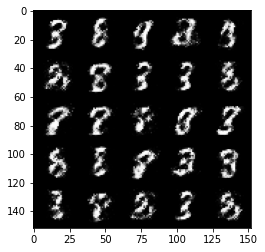

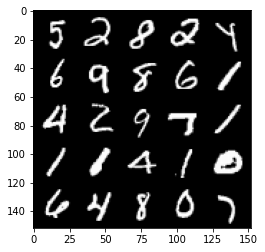

 71%|███████   | 333/469 [00:05<00:02, 56.52it/s]

Step 20500: Generator loss: 3.080859956264496, discriminator loss: 0.16587455393373976


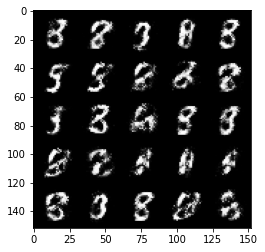

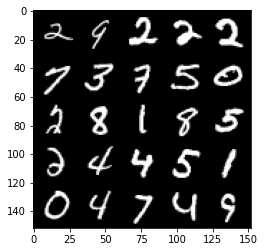

 77%|███████▋  | 363/469 [00:06<00:01, 59.19it/s]

Step 21000: Generator loss: 3.0795447230339064, discriminator loss: 0.18323838067054768


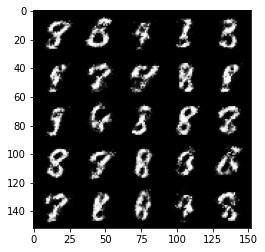

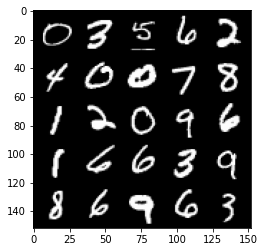

 83%|████████▎ | 391/469 [00:07<00:01, 55.13it/s]

Step 21500: Generator loss: 2.946285737991333, discriminator loss: 0.1935655920654535


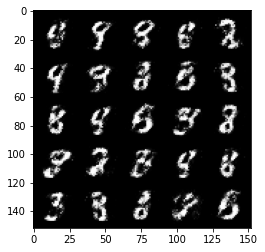

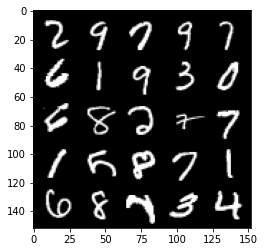

 90%|█████████ | 423/469 [00:07<00:00, 56.66it/s]

Step 22000: Generator loss: 2.928067403793334, discriminator loss: 0.1883602304458618


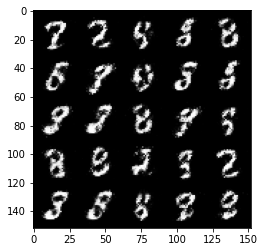

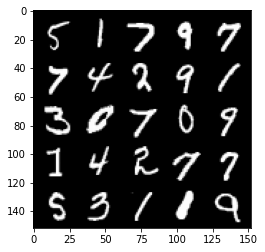

 97%|█████████▋| 454/469 [00:08<00:00, 56.41it/s]

Step 22500: Generator loss: 2.8633488850593576, discriminator loss: 0.19542955176532265


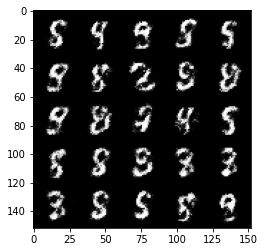

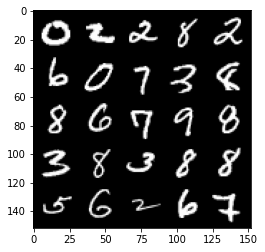

  4%|▍         | 18/469 [00:00<00:08, 53.60it/s]

Step 23000: Generator loss: 3.0091212358474744, discriminator loss: 0.17354372699558748


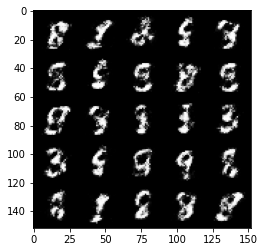

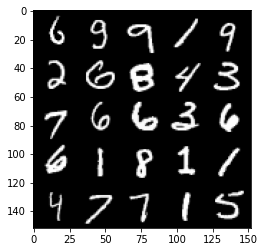

 10%|█         | 49/469 [00:00<00:06, 65.00it/s]

Step 23500: Generator loss: 3.019375477313993, discriminator loss: 0.17688586844503884


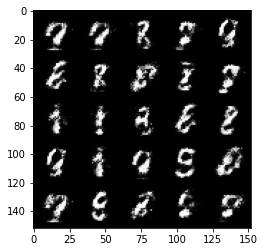

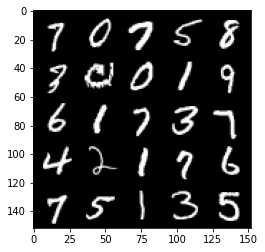

 16%|█▋        | 77/469 [00:01<00:07, 55.32it/s]

Step 24000: Generator loss: 2.9253434453010576, discriminator loss: 0.18645869056880465


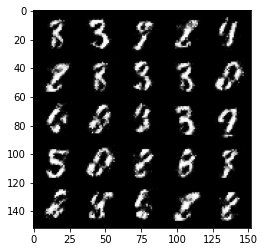

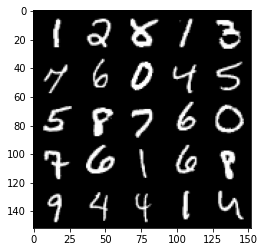

 23%|██▎       | 110/469 [00:01<00:06, 57.50it/s]

Step 24500: Generator loss: 2.9443170742988594, discriminator loss: 0.1842320825904606


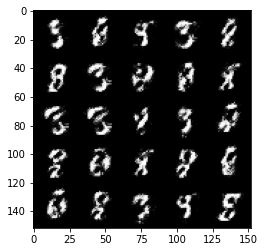

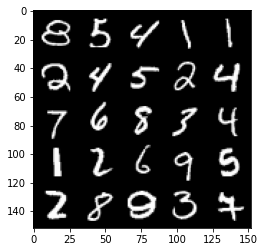

 30%|███       | 141/469 [00:02<00:05, 57.30it/s]

Step 25000: Generator loss: 2.985261631965639, discriminator loss: 0.20312652648985377


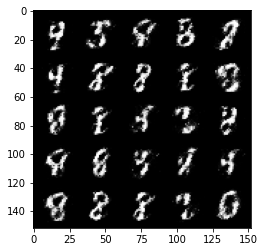

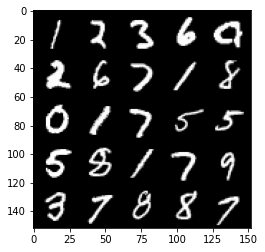

 36%|███▌      | 169/469 [00:03<00:05, 54.96it/s]

Step 25500: Generator loss: 2.8447820930480985, discriminator loss: 0.20849261555075654


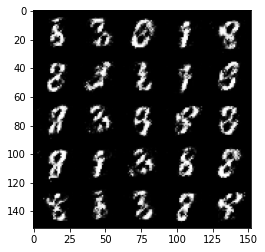

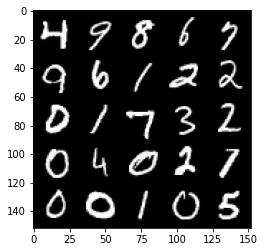

 43%|████▎     | 201/469 [00:03<00:04, 60.48it/s]

Step 26000: Generator loss: 2.8385340356826783, discriminator loss: 0.2042750452309848


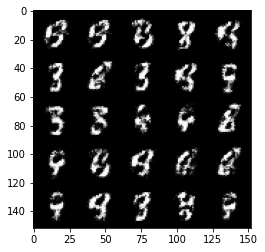

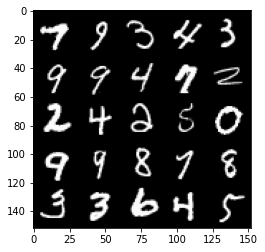

 50%|█████     | 236/469 [00:04<00:04, 54.87it/s]

Step 26500: Generator loss: 2.8952860727310172, discriminator loss: 0.19501586145162603


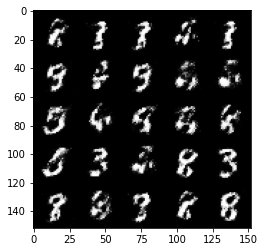

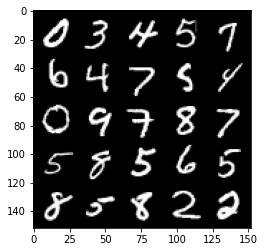

 57%|█████▋    | 266/469 [00:04<00:03, 55.26it/s]

Step 27000: Generator loss: 2.7391219229698174, discriminator loss: 0.21463824345171453


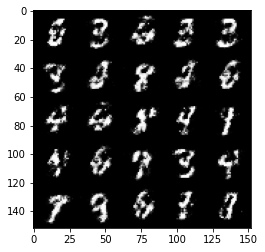

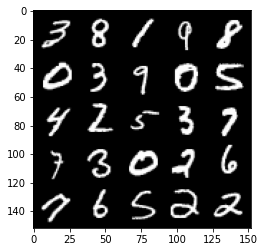

 63%|██████▎   | 297/469 [00:05<00:03, 56.05it/s]

Step 27500: Generator loss: 2.6997669315338104, discriminator loss: 0.21915288326144233


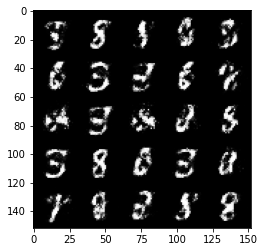

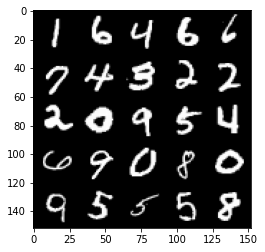

 70%|███████   | 329/469 [00:05<00:02, 53.92it/s]

Step 28000: Generator loss: 2.660128396034241, discriminator loss: 0.2223477694690227


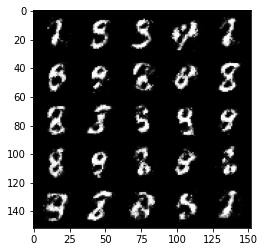

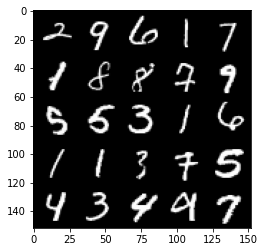

 76%|███████▌  | 357/469 [00:06<00:02, 54.97it/s]

Step 28500: Generator loss: 2.655738365650177, discriminator loss: 0.23334076258540135


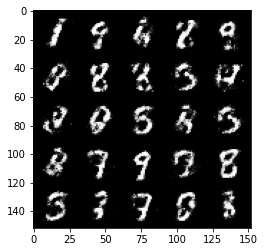

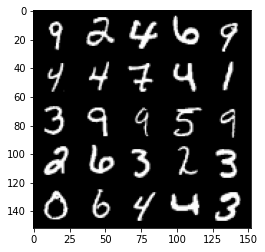

 83%|████████▎ | 391/469 [00:06<00:01, 55.19it/s]

Step 29000: Generator loss: 2.524291352510453, discriminator loss: 0.2596101870834831


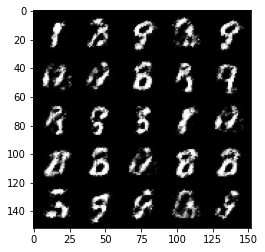

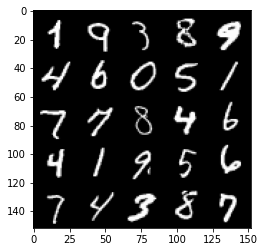

 89%|████████▉ | 417/469 [00:07<00:00, 55.64it/s]

Step 29500: Generator loss: 2.70455705690384, discriminator loss: 0.20906818279623968


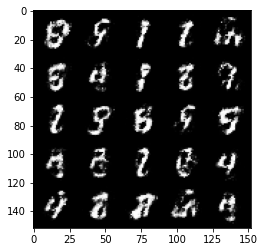

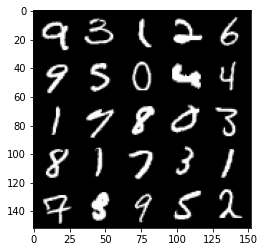

 95%|█████████▌| 447/469 [00:08<00:00, 54.91it/s]

Step 30000: Generator loss: 2.6559711046218863, discriminator loss: 0.21686853569746012


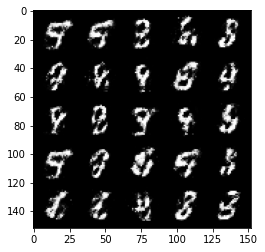

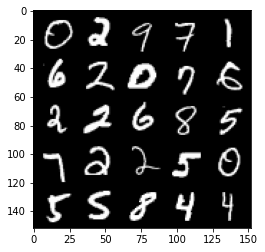

  3%|▎         | 14/469 [00:00<00:07, 61.19it/s]

Step 30500: Generator loss: 2.6044737010002144, discriminator loss: 0.23308462384343154


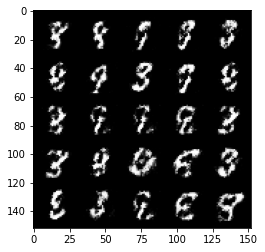

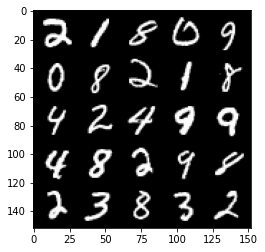

  9%|▉         | 42/469 [00:00<00:07, 55.02it/s]

Step 31000: Generator loss: 2.6198782951831845, discriminator loss: 0.237511788547039


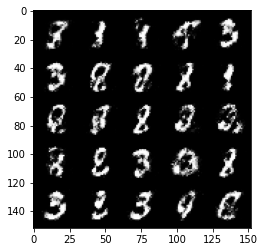

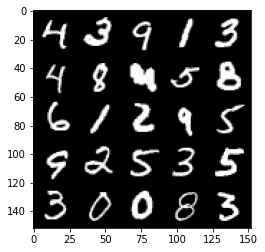

 16%|█▌        | 75/469 [00:01<00:07, 55.12it/s]

Step 31500: Generator loss: 2.4825652847290063, discriminator loss: 0.24857750931382186


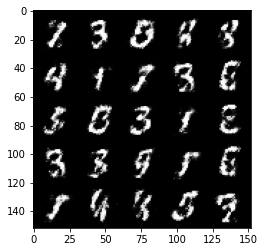

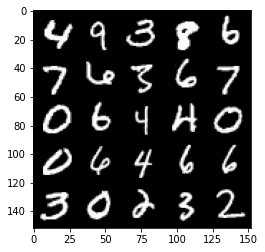

 22%|██▏       | 103/469 [00:01<00:06, 57.18it/s]

Step 32000: Generator loss: 2.556519180774689, discriminator loss: 0.23973117721080775


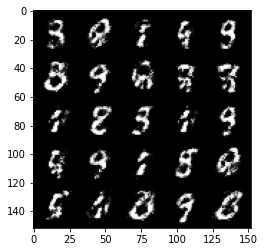

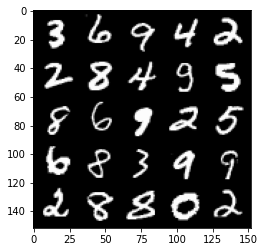

 29%|██▉       | 135/469 [00:02<00:05, 56.93it/s]

Step 32500: Generator loss: 2.5635678942203524, discriminator loss: 0.23877333334088305


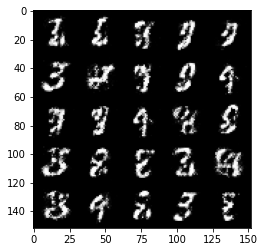

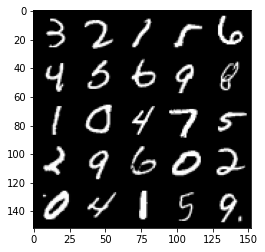

 35%|███▍      | 164/469 [00:02<00:04, 61.13it/s]

Step 33000: Generator loss: 2.3764752063751184, discriminator loss: 0.2721009389162064


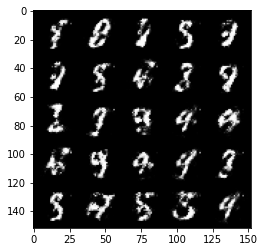

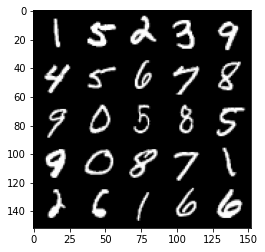

 43%|████▎     | 200/469 [00:03<00:04, 54.29it/s]

Step 33500: Generator loss: 2.478445732593535, discriminator loss: 0.24686517485976237


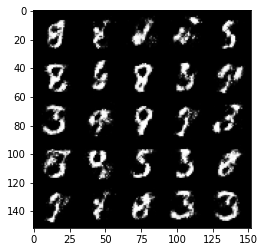

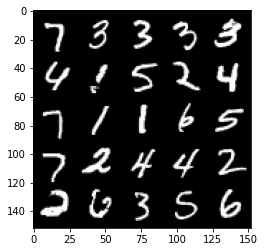

 49%|████▉     | 232/469 [00:04<00:04, 55.63it/s]

Step 34000: Generator loss: 2.4468403267860412, discriminator loss: 0.257301137149334


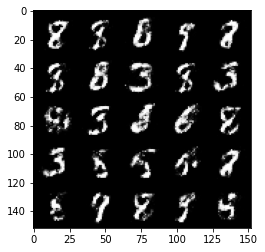

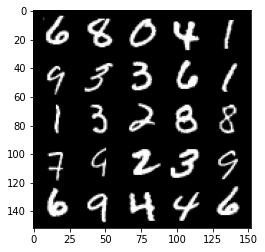

 56%|█████▌    | 262/469 [00:04<00:03, 56.96it/s]

Step 34500: Generator loss: 2.2843622913360555, discriminator loss: 0.286006561756134


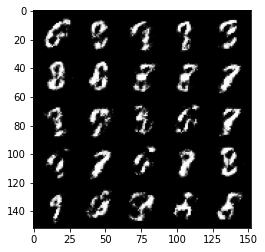

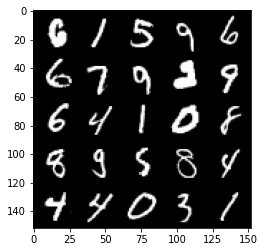

 63%|██████▎   | 294/469 [00:05<00:03, 54.95it/s]

Step 35000: Generator loss: 2.2991189687252023, discriminator loss: 0.27642221295833563


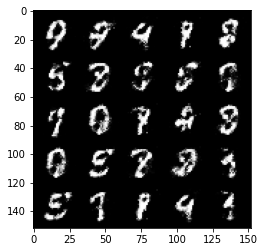

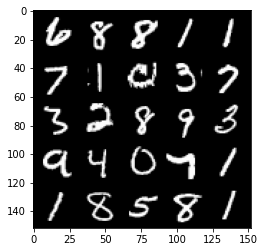

 69%|██████▉   | 325/469 [00:05<00:02, 54.95it/s]

Step 35500: Generator loss: 2.3447121257781984, discriminator loss: 0.27516592052578936


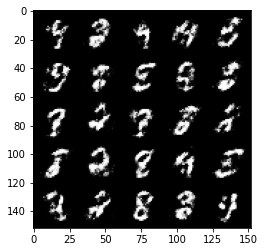

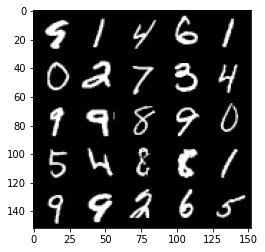

 75%|███████▍  | 351/469 [00:06<00:02, 54.11it/s]

Step 36000: Generator loss: 2.2458143880367265, discriminator loss: 0.2880934423208239


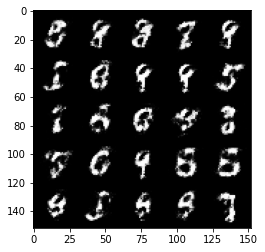

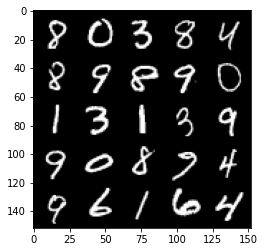

 83%|████████▎ | 387/469 [00:06<00:01, 55.92it/s]

Step 36500: Generator loss: 2.2074563982486723, discriminator loss: 0.2899650318324567


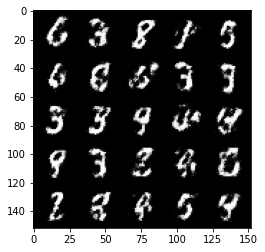

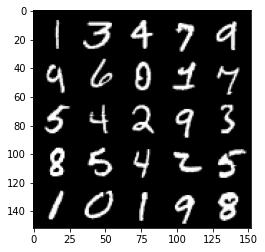

 89%|████████▉ | 418/469 [00:07<00:00, 60.06it/s]

Step 37000: Generator loss: 2.279626757144927, discriminator loss: 0.2717831493616107


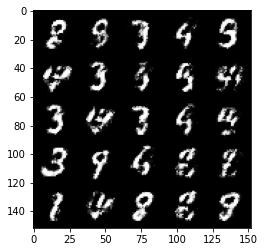

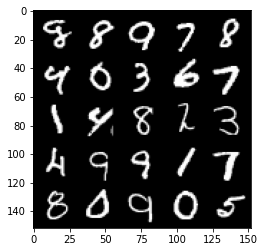

 96%|█████████▌| 448/469 [00:07<00:00, 60.80it/s]

Step 37500: Generator loss: 2.3949111399650582, discriminator loss: 0.27099466609954853


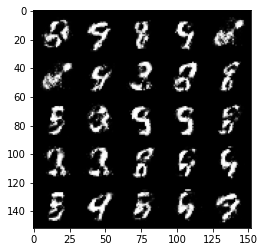

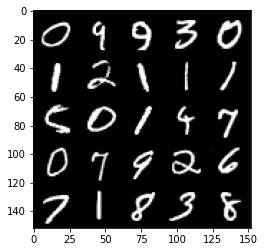

  1%|▏         | 6/469 [00:00<00:08, 56.05it/s]

Step 38000: Generator loss: 2.25562805366516, discriminator loss: 0.2902284439802171


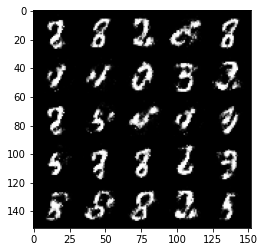

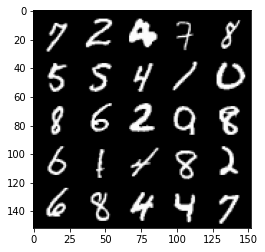

  9%|▉         | 42/469 [00:00<00:06, 62.39it/s]

Step 38500: Generator loss: 2.307514540195465, discriminator loss: 0.2808110752701761


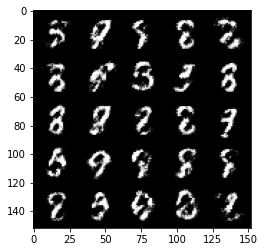

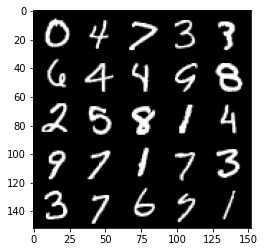

 15%|█▌        | 72/469 [00:01<00:06, 56.94it/s]

Step 39000: Generator loss: 2.2848209874629983, discriminator loss: 0.27105916637182237


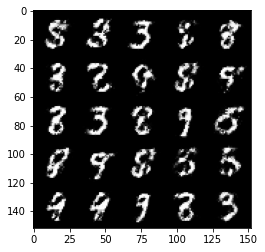

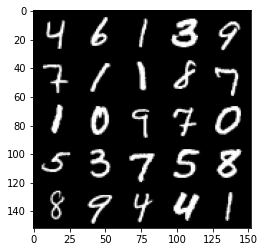

 21%|██        | 99/469 [00:01<00:06, 54.21it/s]

Step 39500: Generator loss: 2.327101688146591, discriminator loss: 0.2766120911836626


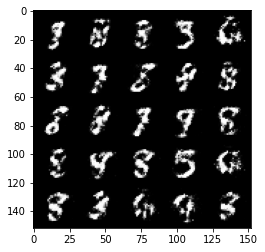

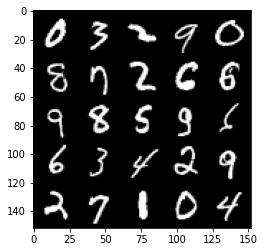

 28%|██▊       | 131/469 [00:02<00:05, 56.69it/s]

Step 40000: Generator loss: 2.1520407116413143, discriminator loss: 0.30503680616617207


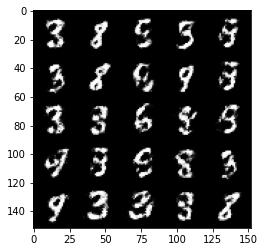

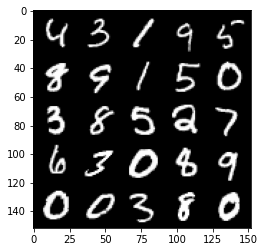

 35%|███▌      | 166/469 [00:02<00:05, 54.81it/s]

Step 40500: Generator loss: 2.136091378688812, discriminator loss: 0.306165544956923


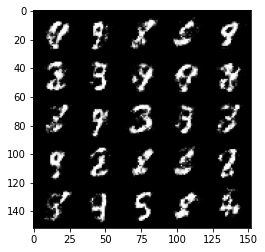

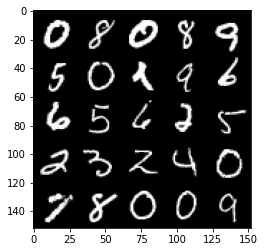

 42%|████▏     | 196/469 [00:03<00:04, 56.27it/s]

Step 41000: Generator loss: 2.12286810350418, discriminator loss: 0.30312292808294283


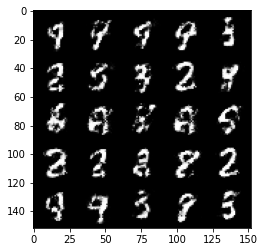

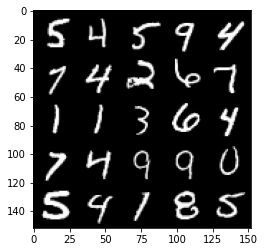

 48%|████▊     | 223/469 [00:03<00:04, 57.72it/s]

Step 41500: Generator loss: 2.2042592115402204, discriminator loss: 0.2924757576286792


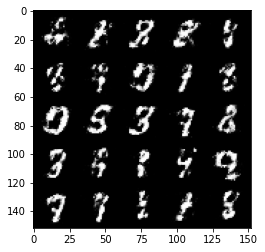

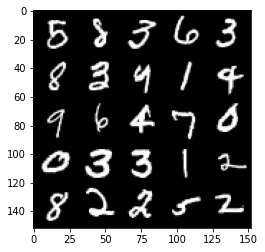

 55%|█████▍    | 256/469 [00:04<00:03, 57.67it/s]

Step 42000: Generator loss: 2.1927737064361583, discriminator loss: 0.2844288845956328


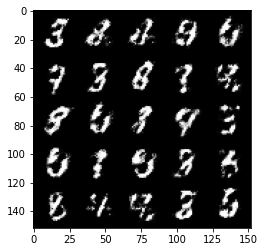

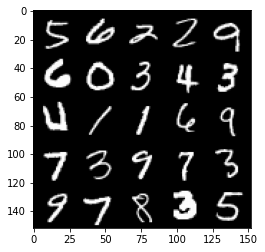

 61%|██████▏   | 288/469 [00:05<00:03, 55.16it/s]

Step 42500: Generator loss: 2.247663765430451, discriminator loss: 0.2897751560807228


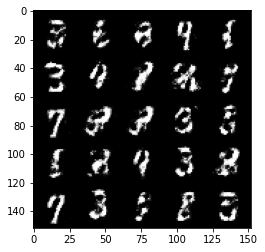

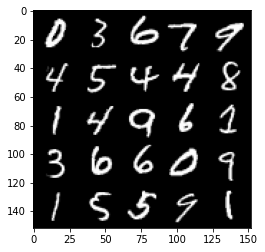

 68%|██████▊   | 319/469 [00:05<00:02, 54.13it/s]

Step 43000: Generator loss: 1.9667619392871856, discriminator loss: 0.3638939616978169


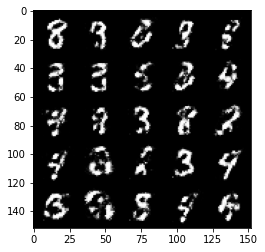

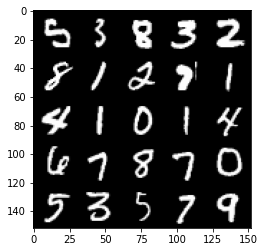

 75%|███████▍  | 350/469 [00:06<00:02, 55.81it/s]

Step 43500: Generator loss: 1.941303973913192, discriminator loss: 0.35582740160822873


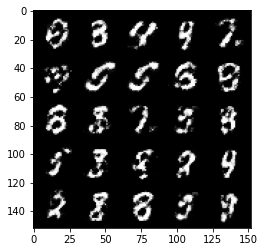

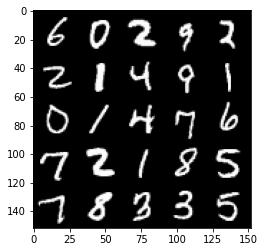

 82%|████████▏ | 383/469 [00:07<00:01, 54.57it/s]

Step 44000: Generator loss: 2.019427441358566, discriminator loss: 0.3283184368908404


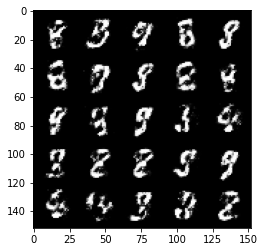

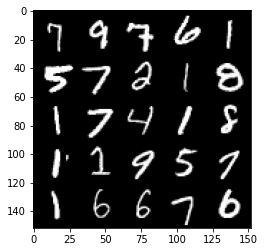

 88%|████████▊ | 412/469 [00:07<00:01, 56.31it/s]

Step 44500: Generator loss: 2.077112264871597, discriminator loss: 0.31319437733292566


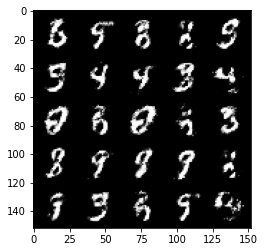

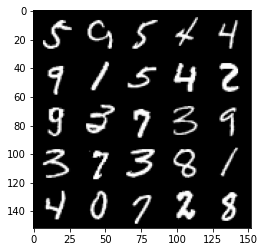

 95%|█████████▍| 445/469 [00:08<00:00, 55.32it/s]

Step 45000: Generator loss: 2.0826103045940383, discriminator loss: 0.30724031424522374


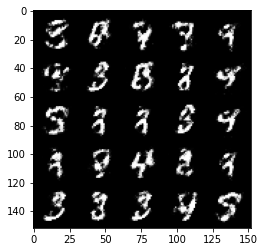

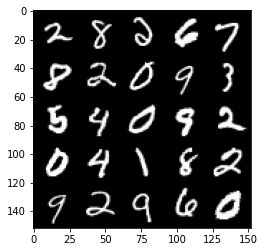

  1%|▏         | 7/469 [00:00<00:07, 62.24it/s]

Step 45500: Generator loss: 2.01010963368416, discriminator loss: 0.3319616477191447


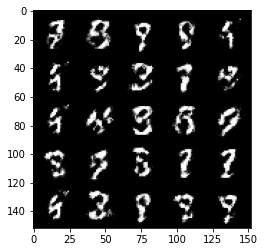

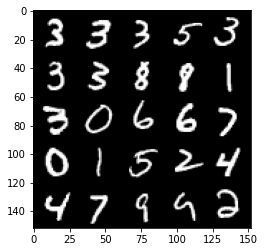

  7%|▋         | 35/469 [00:00<00:06, 63.41it/s]

Step 46000: Generator loss: 1.9777668197154985, discriminator loss: 0.3398087212741376


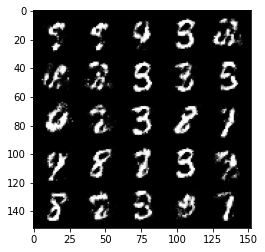

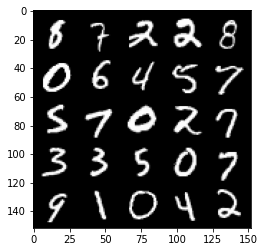

 14%|█▍        | 68/469 [00:01<00:07, 55.08it/s]

Step 46500: Generator loss: 2.0117528860569007, discriminator loss: 0.32581429615616786


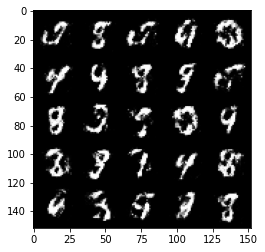

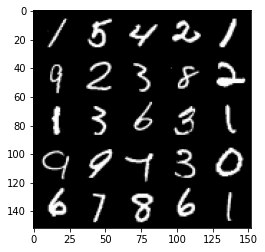

 20%|██        | 96/469 [00:01<00:06, 55.76it/s]

Step 47000: Generator loss: 1.9956169898509961, discriminator loss: 0.3249584743678571


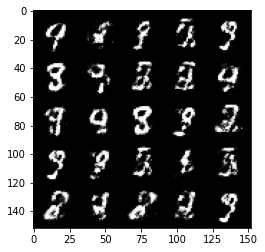

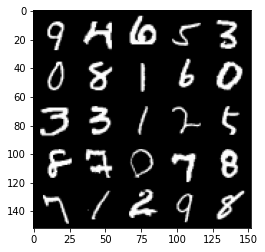

 28%|██▊       | 129/469 [00:02<00:06, 55.14it/s]

Step 47500: Generator loss: 1.9400948269367235, discriminator loss: 0.33615182578563685


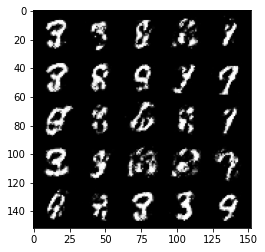

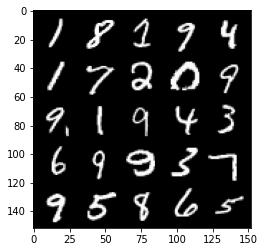

 33%|███▎      | 157/469 [00:02<00:05, 54.99it/s]

Step 48000: Generator loss: 1.8696189274787898, discriminator loss: 0.3497494006454946


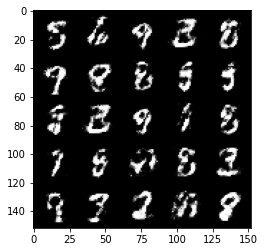

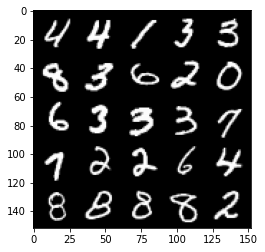

 41%|████      | 192/469 [00:03<00:05, 54.77it/s]

Step 48500: Generator loss: 1.9519612452983877, discriminator loss: 0.3278558577895164


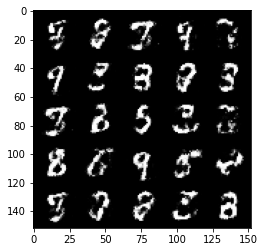

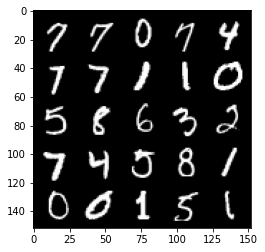

 47%|████▋     | 222/469 [00:04<00:04, 55.98it/s]

Step 49000: Generator loss: 1.9551961944103249, discriminator loss: 0.33248706889152535


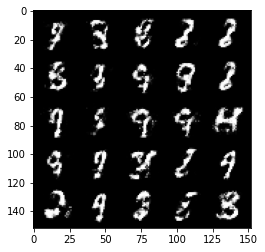

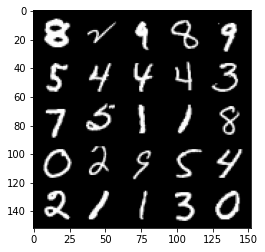

 54%|█████▎    | 251/469 [00:04<00:04, 54.30it/s]

Step 49500: Generator loss: 1.944896177768708, discriminator loss: 0.33038167038559924


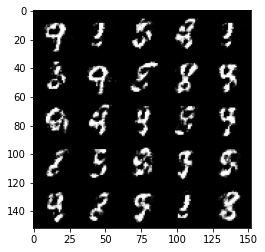

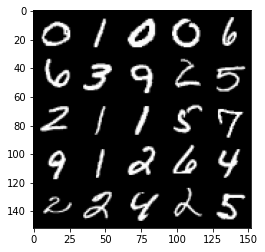

 60%|██████    | 282/469 [00:05<00:03, 55.29it/s]

Step 50000: Generator loss: 1.9024168829917891, discriminator loss: 0.35369392430782337


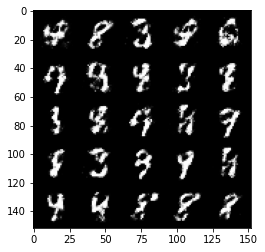

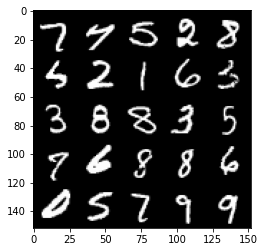

 66%|██████▋   | 311/469 [00:05<00:02, 57.91it/s]

Step 50500: Generator loss: 1.8821915240287779, discriminator loss: 0.3457577521204949


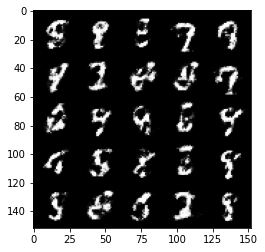

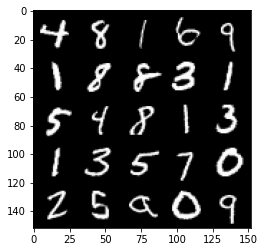

 74%|███████▍  | 348/469 [00:06<00:02, 54.83it/s]

Step 51000: Generator loss: 1.9268313210010535, discriminator loss: 0.3435515548884866


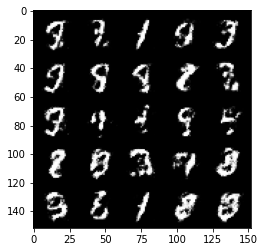

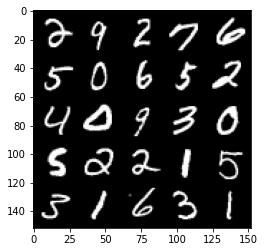

 80%|███████▉  | 375/469 [00:06<00:01, 57.51it/s]

Step 51500: Generator loss: 1.8446585891246803, discriminator loss: 0.35589563775062566


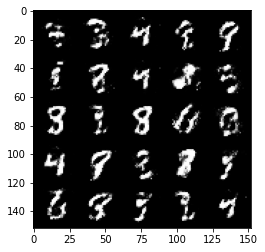

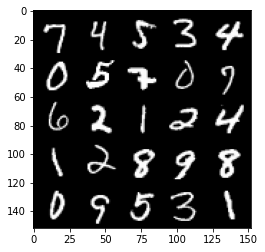

 87%|████████▋ | 409/469 [00:07<00:01, 55.10it/s]

Step 52000: Generator loss: 1.8982991452217115, discriminator loss: 0.3329859571158887


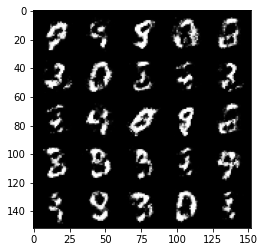

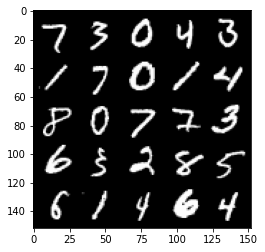

 94%|█████████▎| 439/469 [00:07<00:00, 55.70it/s]

Step 52500: Generator loss: 1.7759773554801934, discriminator loss: 0.3775689604878425


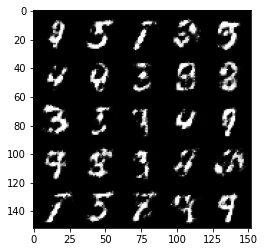

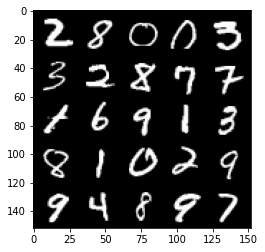

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 1.829866305828095, discriminator loss: 0.35815434896945936


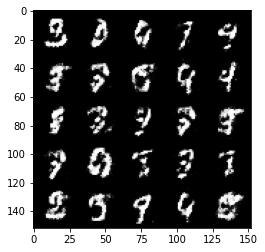

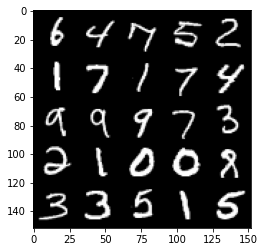

  6%|▋         | 30/469 [00:00<00:08, 54.23it/s]

Step 53500: Generator loss: 1.7760162191391005, discriminator loss: 0.38372285777330356


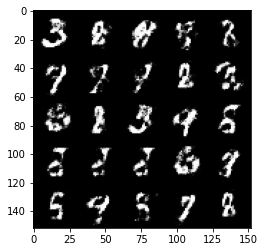

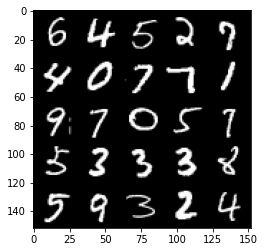

 14%|█▍        | 65/469 [00:01<00:06, 61.04it/s]

Step 54000: Generator loss: 1.7766152684688563, discriminator loss: 0.3866436494588852


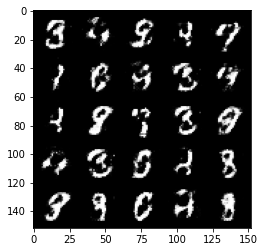

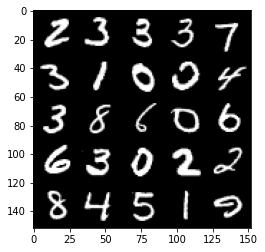

 20%|██        | 96/469 [00:01<00:06, 57.49it/s]

Step 54500: Generator loss: 1.8526943583488467, discriminator loss: 0.3564752829968932


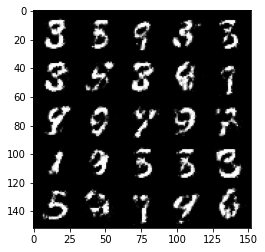

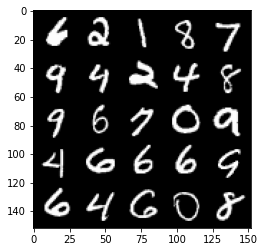

 27%|██▋       | 126/469 [00:02<00:06, 54.60it/s]

Step 55000: Generator loss: 1.7278040311336522, discriminator loss: 0.3864166312217709


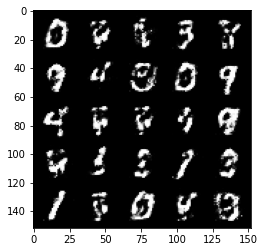

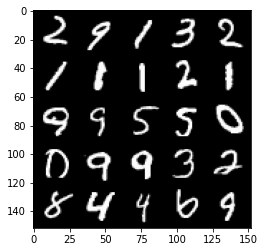

 33%|███▎      | 154/469 [00:02<00:05, 56.72it/s]

Step 55500: Generator loss: 1.7403867309093475, discriminator loss: 0.37845906722545636


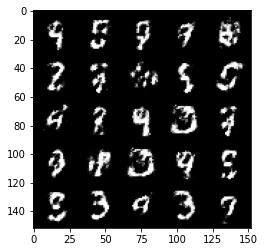

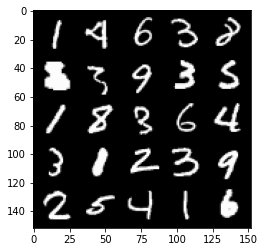

 40%|███▉      | 186/469 [00:03<00:05, 55.41it/s]

Step 56000: Generator loss: 1.6748581154346474, discriminator loss: 0.3905370613932616


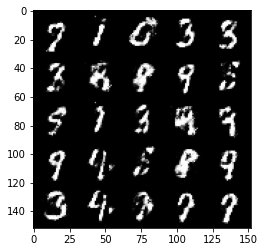

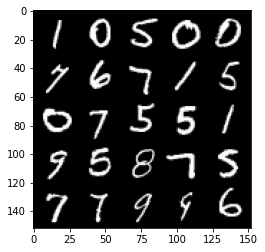

 47%|████▋     | 219/469 [00:03<00:04, 60.31it/s]

Step 56500: Generator loss: 1.7120173189640038, discriminator loss: 0.3797520655393602


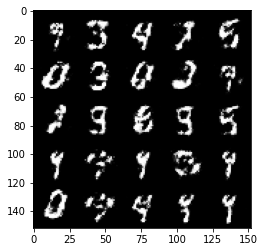

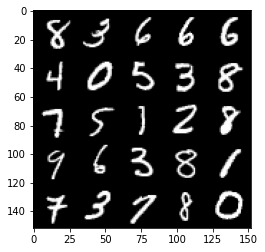

 53%|█████▎    | 250/469 [00:04<00:04, 54.50it/s]

Step 57000: Generator loss: 1.7883363971710204, discriminator loss: 0.3614452786445617


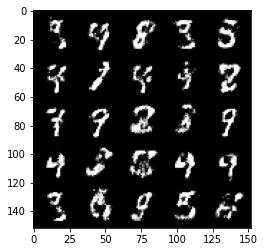

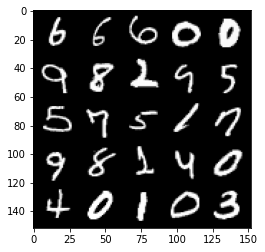

 60%|█████▉    | 280/469 [00:05<00:03, 54.18it/s]

Step 57500: Generator loss: 1.5800417976379397, discriminator loss: 0.42289738482236805


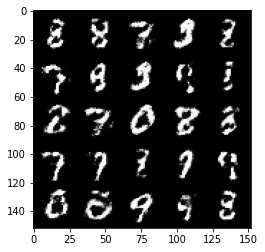

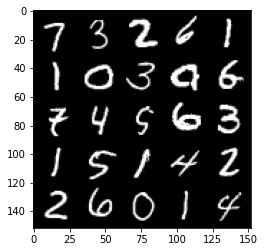

 67%|██████▋   | 312/469 [00:05<00:02, 54.76it/s]

Step 58000: Generator loss: 1.6045609719753264, discriminator loss: 0.40446325862407656


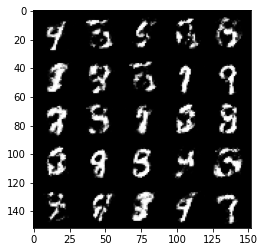

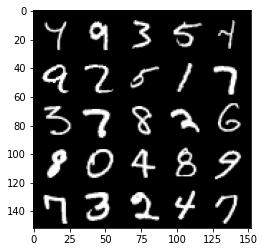

 72%|███████▏  | 339/469 [00:06<00:02, 55.53it/s]

Step 58500: Generator loss: 1.697362229108809, discriminator loss: 0.37287208110094033


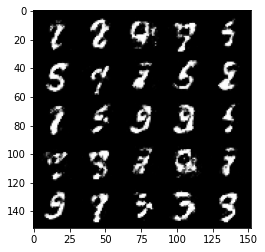

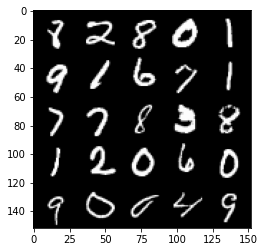

 80%|███████▉  | 375/469 [00:06<00:01, 55.71it/s]

Step 59000: Generator loss: 1.8053118541240691, discriminator loss: 0.35726961216330533


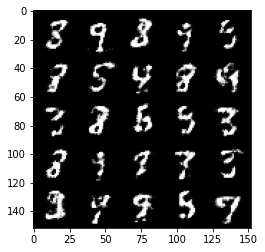

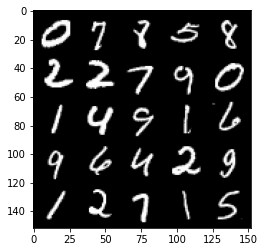

 86%|████████▌ | 404/469 [00:07<00:01, 55.81it/s]

Step 59500: Generator loss: 1.7155398206710806, discriminator loss: 0.37870840835571296


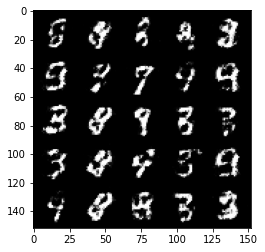

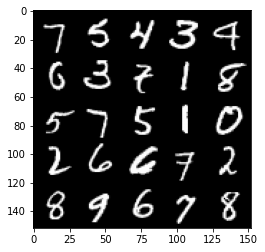

 92%|█████████▏| 433/469 [00:07<00:00, 53.80it/s]

Step 60000: Generator loss: 1.6646235878467543, discriminator loss: 0.39659756726026546


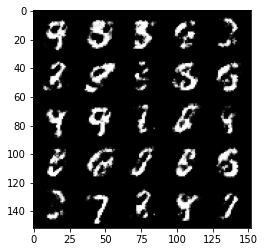

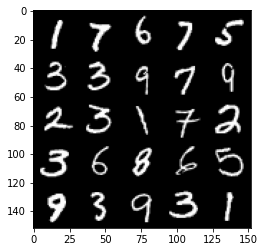

100%|█████████▉| 467/469 [00:08<00:00, 52.89it/s]

Step 60500: Generator loss: 1.5806770331859576, discriminator loss: 0.4126344920396809


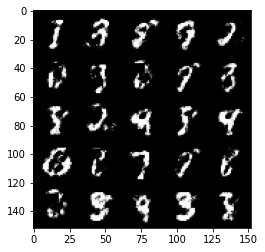

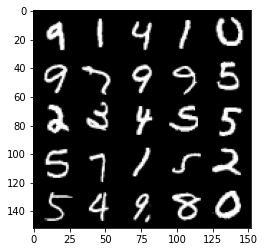

  6%|▋         | 30/469 [00:00<00:07, 57.39it/s]

Step 61000: Generator loss: 1.718875823497771, discriminator loss: 0.3646842969059943


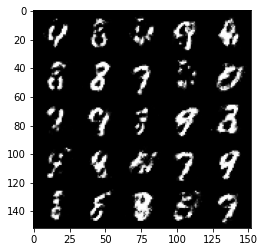

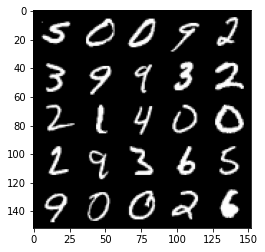

 12%|█▏        | 58/469 [00:01<00:07, 56.66it/s]

Step 61500: Generator loss: 1.637857188224794, discriminator loss: 0.3858805453777311


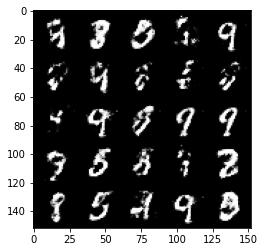

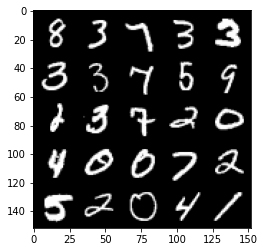

 20%|█▉        | 92/469 [00:01<00:06, 56.32it/s]

Step 62000: Generator loss: 1.642204043388367, discriminator loss: 0.38222211474180223


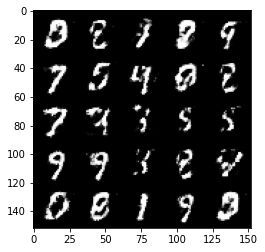

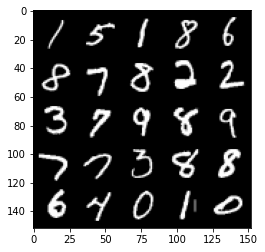

 25%|██▌       | 118/469 [00:02<00:05, 59.12it/s]

Step 62500: Generator loss: 1.7385875875949859, discriminator loss: 0.37238876092433926


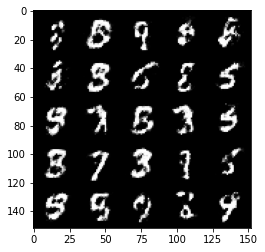

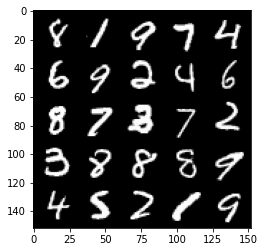

 33%|███▎      | 153/469 [00:02<00:05, 56.51it/s]

Step 63000: Generator loss: 1.600419391393662, discriminator loss: 0.4132500799298287


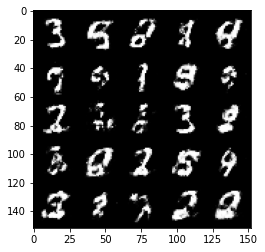

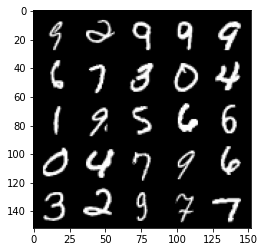

 39%|███▉      | 183/469 [00:03<00:05, 55.15it/s]

Step 63500: Generator loss: 1.6614850573539737, discriminator loss: 0.39922867941856377


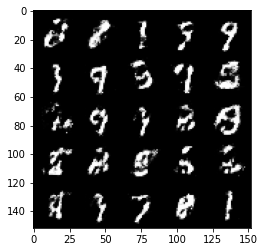

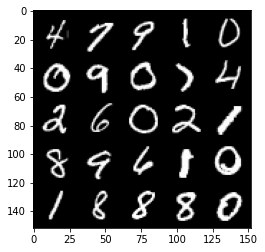

 46%|████▌     | 216/469 [00:03<00:04, 54.16it/s]

Step 64000: Generator loss: 1.5208359317779554, discriminator loss: 0.43277924895286557


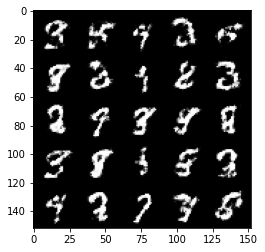

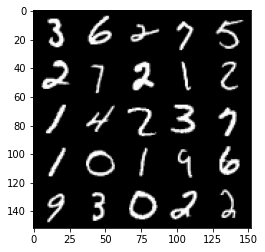

 53%|█████▎    | 247/469 [00:04<00:04, 54.26it/s]

Step 64500: Generator loss: 1.486918385982513, discriminator loss: 0.4479880334138873


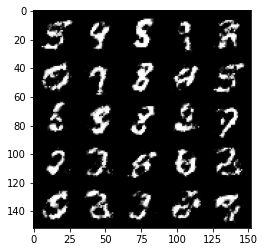

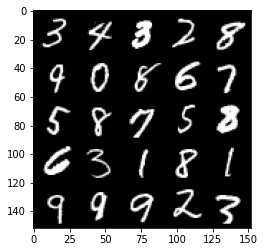

 59%|█████▉    | 276/469 [00:05<00:03, 55.82it/s]

Step 65000: Generator loss: 1.5617218060493459, discriminator loss: 0.4091989604234695


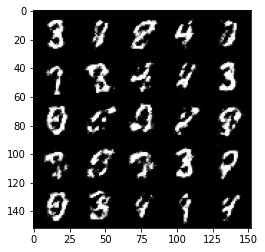

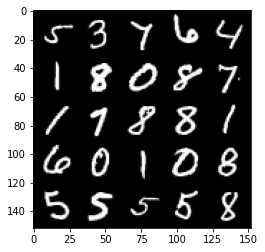

 65%|██████▌   | 306/469 [00:05<00:02, 55.42it/s]

Step 65500: Generator loss: 1.5512525022029873, discriminator loss: 0.42491988247632995


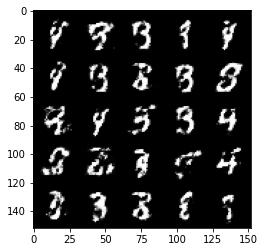

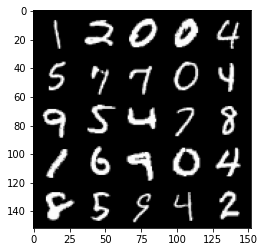

 71%|███████▏  | 335/469 [00:05<00:02, 55.85it/s]

Step 66000: Generator loss: 1.5792502484321582, discriminator loss: 0.40757926076650614


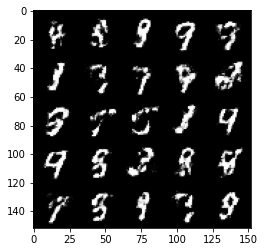

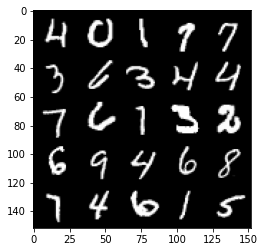

 78%|███████▊  | 368/469 [00:06<00:01, 58.40it/s]

Step 66500: Generator loss: 1.4954231894016277, discriminator loss: 0.4346122793555261


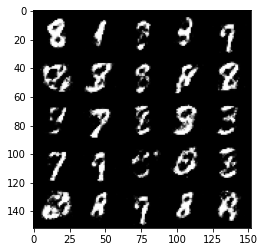

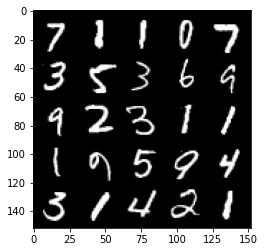

 85%|████████▍ | 398/469 [00:07<00:01, 55.86it/s]

Step 67000: Generator loss: 1.4836762738227849, discriminator loss: 0.41701633518934256


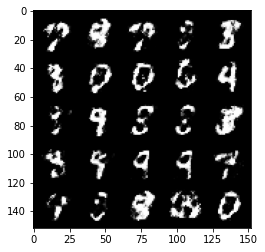

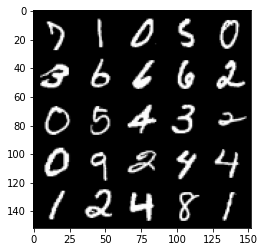

 91%|█████████▏| 428/469 [00:07<00:00, 54.90it/s]

Step 67500: Generator loss: 1.4193021023273453, discriminator loss: 0.43723245924711224


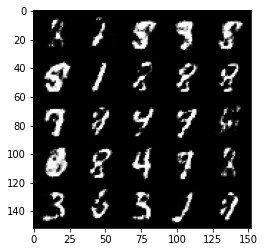

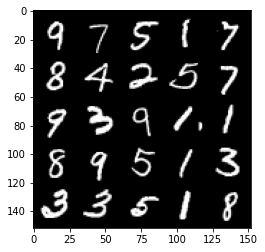

 98%|█████████▊| 459/469 [00:08<00:00, 57.86it/s]

Step 68000: Generator loss: 1.4722938771247855, discriminator loss: 0.42010300695896163


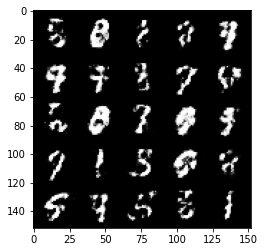

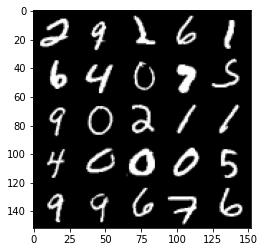

  5%|▌         | 24/469 [00:00<00:07, 57.69it/s]

Step 68500: Generator loss: 1.5885799133777643, discriminator loss: 0.3999409142136578


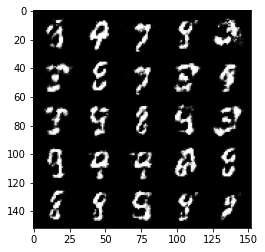

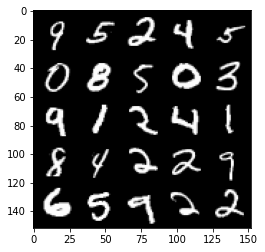

 12%|█▏        | 54/469 [00:00<00:07, 55.54it/s]

Step 69000: Generator loss: 1.5570844378471371, discriminator loss: 0.4160088817477229


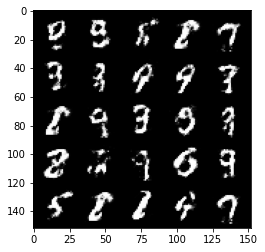

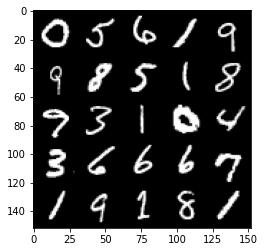

 19%|█▊        | 87/469 [00:01<00:06, 56.14it/s]

Step 69500: Generator loss: 1.5585622470378888, discriminator loss: 0.40820642405748364


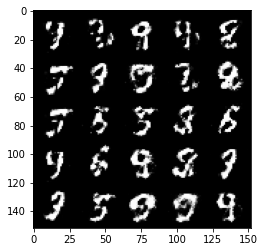

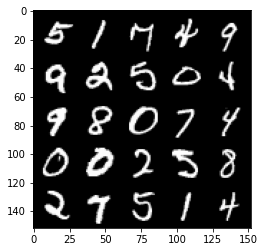

 24%|██▍       | 114/469 [00:02<00:06, 53.13it/s]

Step 70000: Generator loss: 1.6377031774520878, discriminator loss: 0.3826338613033295


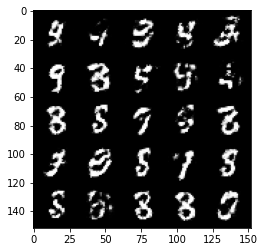

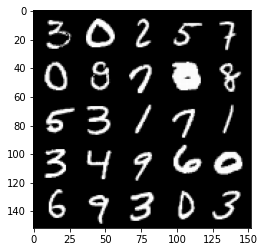

 31%|███       | 145/469 [00:02<00:06, 51.27it/s]

Step 70500: Generator loss: 1.662860544919968, discriminator loss: 0.38061374419927624


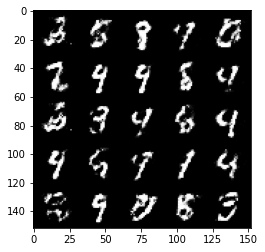

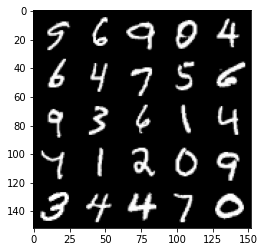

 39%|███▊      | 181/469 [00:03<00:06, 41.89it/s]

Step 71000: Generator loss: 1.6453382763862618, discriminator loss: 0.38141861093044244


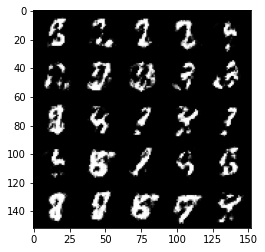

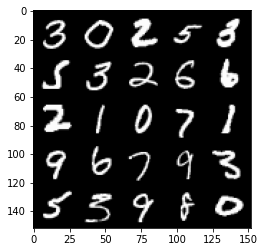

 45%|████▍     | 211/469 [00:03<00:04, 53.24it/s]

Step 71500: Generator loss: 1.5758855535984027, discriminator loss: 0.4004984701275827


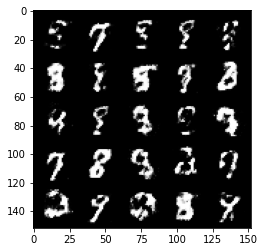

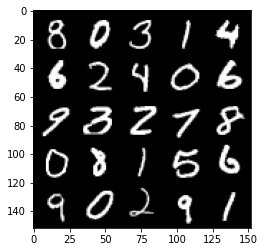

 51%|█████     | 239/469 [00:04<00:04, 52.98it/s]

Step 72000: Generator loss: 1.5359814441204065, discriminator loss: 0.3937551382780078


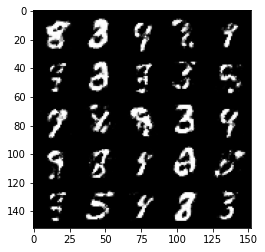

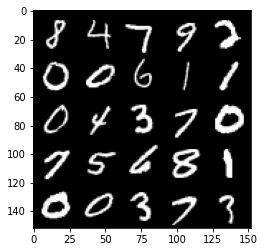

 58%|█████▊    | 273/469 [00:05<00:03, 54.59it/s]

Step 72500: Generator loss: 1.5319245223999032, discriminator loss: 0.4130402039289477


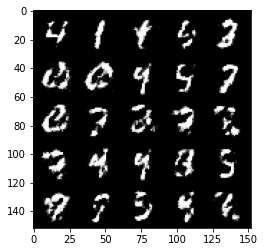

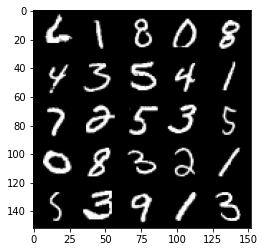

 65%|██████▌   | 305/469 [00:05<00:03, 52.21it/s]

Step 73000: Generator loss: 1.485738839626313, discriminator loss: 0.4533712979555129


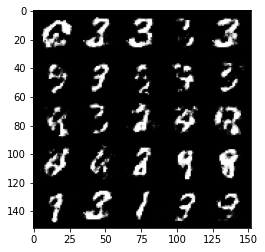

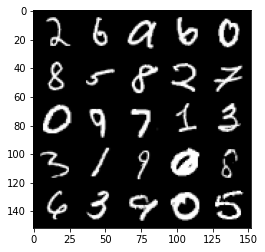

 72%|███████▏  | 336/469 [00:06<00:02, 53.33it/s]

Step 73500: Generator loss: 1.5298867475986468, discriminator loss: 0.41391583257913594


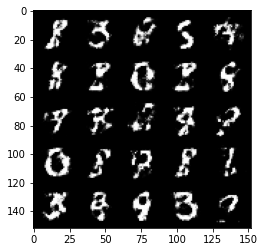

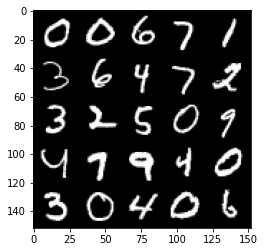

 77%|███████▋  | 362/469 [00:06<00:01, 56.57it/s]

Step 74000: Generator loss: 1.5621717593669882, discriminator loss: 0.4101639697551725


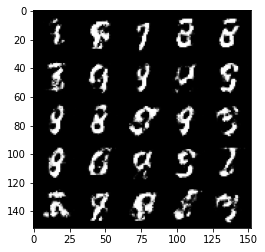

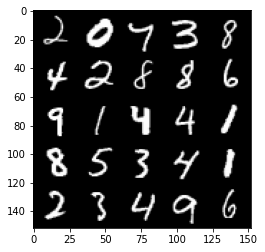

 84%|████████▍ | 396/469 [00:07<00:01, 52.29it/s]

Step 74500: Generator loss: 1.5169924566745747, discriminator loss: 0.4239635192751885


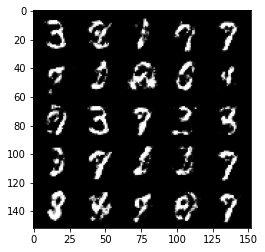

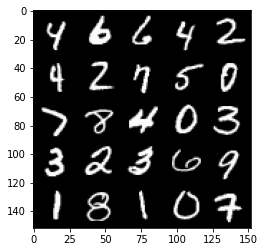

 91%|█████████▏| 428/469 [00:08<00:00, 57.89it/s]

Step 75000: Generator loss: 1.5871004121303556, discriminator loss: 0.40771263498067845


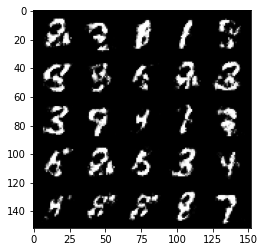

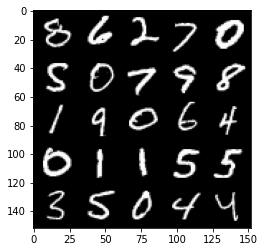

 97%|█████████▋| 457/469 [00:08<00:00, 53.78it/s]

Step 75500: Generator loss: 1.5026987352371228, discriminator loss: 0.43278579729795463


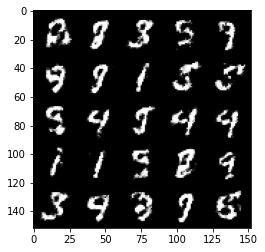

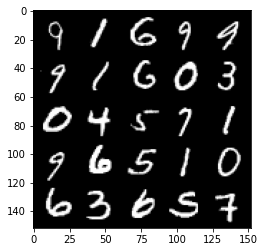

  4%|▍         | 18/469 [00:00<00:08, 53.41it/s]

Step 76000: Generator loss: 1.5020705018043514, discriminator loss: 0.4271931259036065


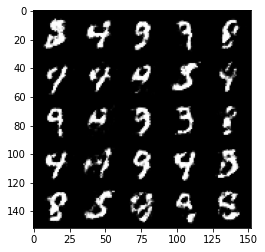

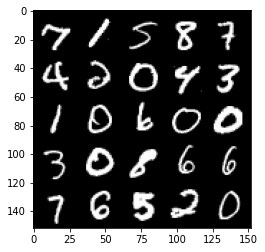

 10%|█         | 49/469 [00:00<00:07, 54.37it/s]

Step 76500: Generator loss: 1.5172493953704833, discriminator loss: 0.42429400610923773


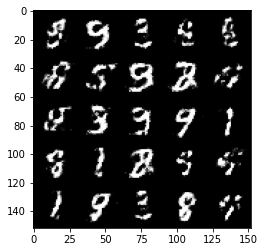

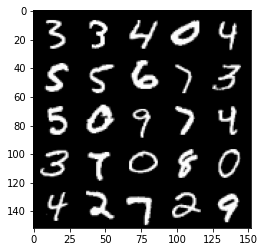

 18%|█▊        | 84/469 [00:01<00:07, 54.39it/s]

Step 77000: Generator loss: 1.4658983066082, discriminator loss: 0.4323423207998277


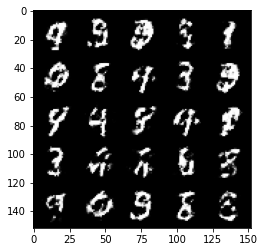

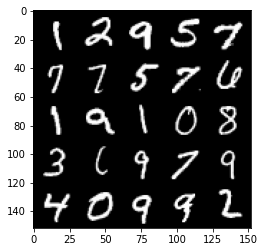

 24%|██▍       | 114/469 [00:02<00:06, 53.35it/s]

Step 77500: Generator loss: 1.4617227859497082, discriminator loss: 0.4279061284065249


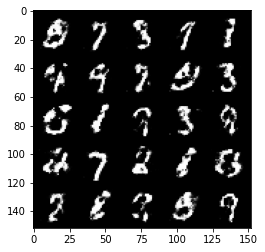

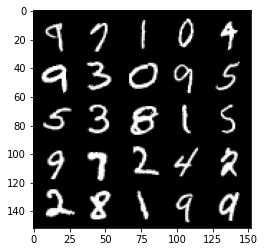

 31%|███       | 144/469 [00:02<00:05, 55.44it/s]

Step 78000: Generator loss: 1.394095483779908, discriminator loss: 0.4487183593511582


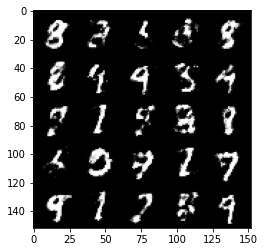

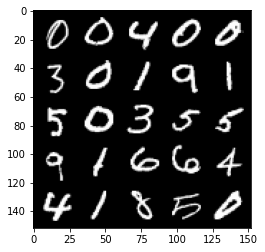

 37%|███▋      | 174/469 [00:03<00:05, 56.25it/s]

Step 78500: Generator loss: 1.3403552839756008, discriminator loss: 0.47572759962081923


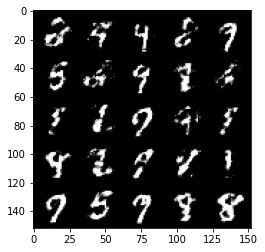

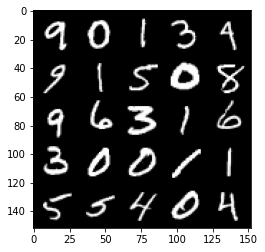

 44%|████▍     | 207/469 [00:03<00:04, 55.36it/s]

Step 79000: Generator loss: 1.4559111220836634, discriminator loss: 0.426395601630211


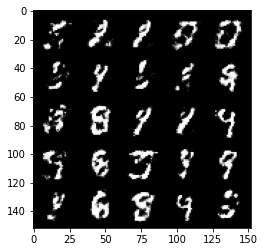

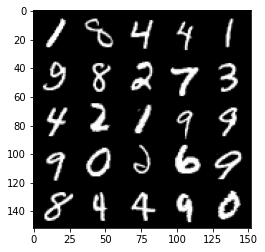

 50%|████▉     | 234/469 [00:04<00:04, 53.05it/s]

Step 79500: Generator loss: 1.3996602997779835, discriminator loss: 0.4476043379902843


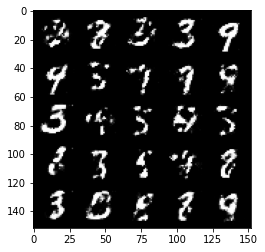

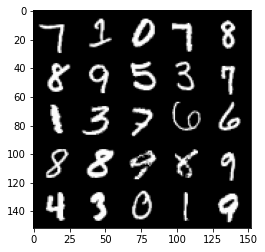

 58%|█████▊    | 270/469 [00:05<00:03, 53.21it/s]

Step 80000: Generator loss: 1.4939321789741506, discriminator loss: 0.42326932507753373


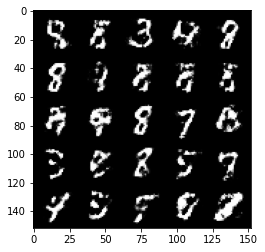

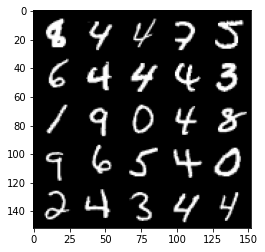

 64%|██████▍   | 301/469 [00:05<00:03, 54.53it/s]

Step 80500: Generator loss: 1.3514315764904024, discriminator loss: 0.47262771838903433


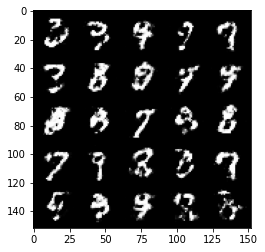

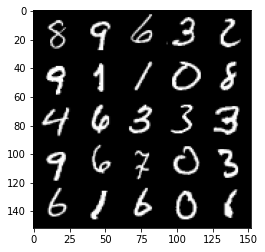

 70%|███████   | 330/469 [00:06<00:02, 53.53it/s]

Step 81000: Generator loss: 1.3288301453590388, discriminator loss: 0.47647269409894905


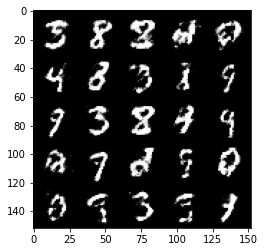

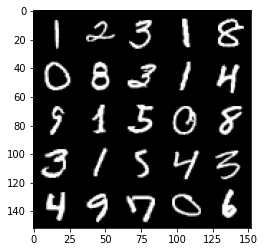

 76%|███████▋  | 358/469 [00:06<00:01, 58.13it/s]

Step 81500: Generator loss: 1.3184397244453423, discriminator loss: 0.464115946054459


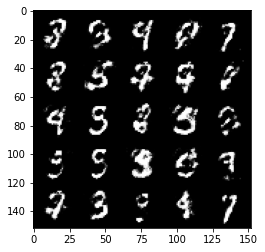

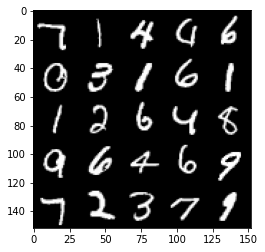

 84%|████████▎ | 392/469 [00:07<00:01, 54.01it/s]

Step 82000: Generator loss: 1.3329533119201669, discriminator loss: 0.4700960279703137


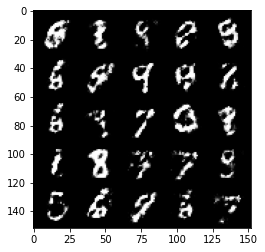

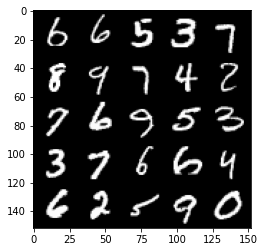

 90%|████████▉ | 421/469 [00:07<00:00, 54.23it/s]

Step 82500: Generator loss: 1.3669968419075005, discriminator loss: 0.45482968330383317


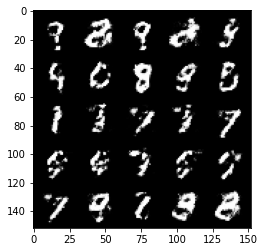

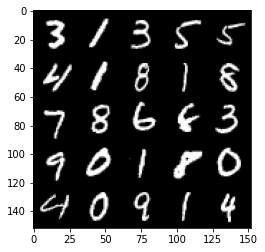

 97%|█████████▋| 454/469 [00:08<00:00, 54.43it/s]

Step 83000: Generator loss: 1.3048330317735684, discriminator loss: 0.49007808125019026


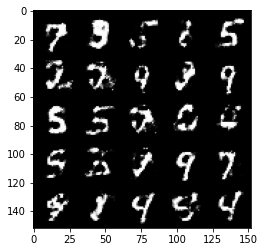

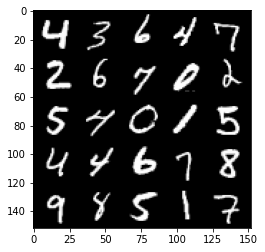

  4%|▍         | 18/469 [00:00<00:08, 54.78it/s]

Step 83500: Generator loss: 1.2958458325862878, discriminator loss: 0.4757484714388843


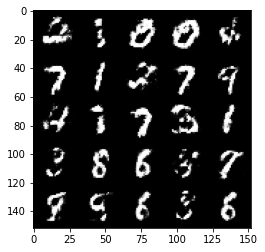

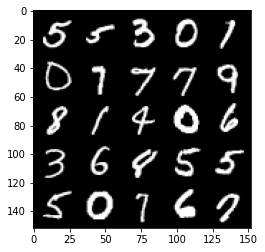

 10%|█         | 48/469 [00:00<00:07, 54.68it/s]

Step 84000: Generator loss: 1.316322701215742, discriminator loss: 0.4736994752287865


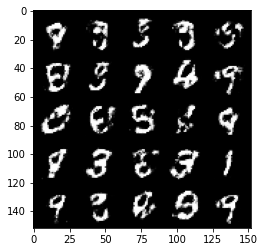

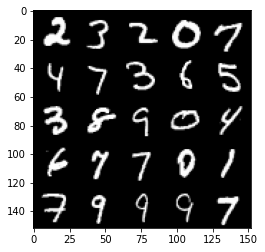

 17%|█▋        | 78/469 [00:01<00:07, 54.71it/s]

Step 84500: Generator loss: 1.2886072447299957, discriminator loss: 0.48490885639190673


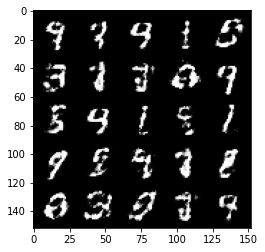

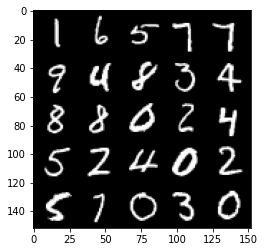

 23%|██▎       | 108/469 [00:02<00:06, 53.76it/s]

Step 85000: Generator loss: 1.3537913503646852, discriminator loss: 0.4779367955923076


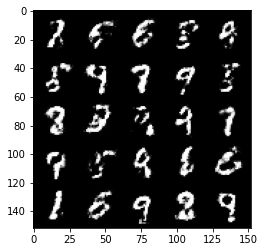

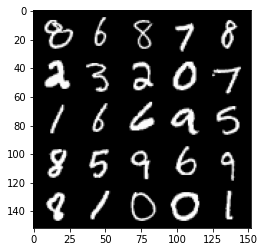

 30%|██▉       | 140/469 [00:02<00:06, 53.31it/s]

Step 85500: Generator loss: 1.2488330485820773, discriminator loss: 0.5097686066031458


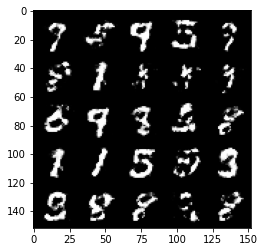

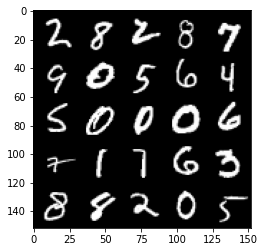

 36%|███▌      | 168/469 [00:03<00:05, 53.08it/s]

Step 86000: Generator loss: 1.2954864730834967, discriminator loss: 0.483917186141014


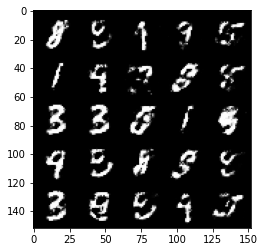

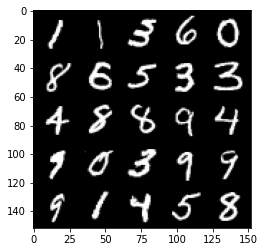

 42%|████▏     | 199/469 [00:03<00:05, 52.86it/s]

Step 86500: Generator loss: 1.3032524292469017, discriminator loss: 0.47229057490825677


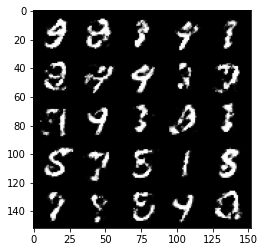

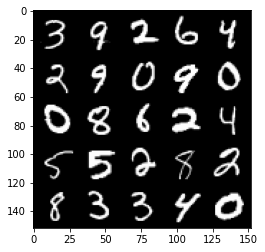

 50%|█████     | 235/469 [00:04<00:04, 54.52it/s]

Step 87000: Generator loss: 1.2857398896217345, discriminator loss: 0.4854062418937685


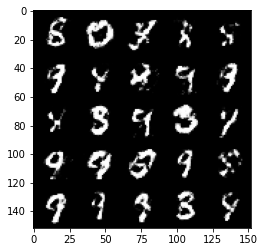

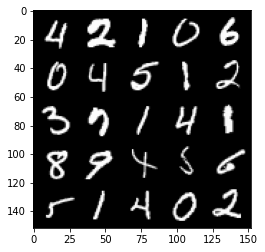

 57%|█████▋    | 265/469 [00:04<00:04, 49.60it/s]

Step 87500: Generator loss: 1.2222046227455141, discriminator loss: 0.5065365028977395


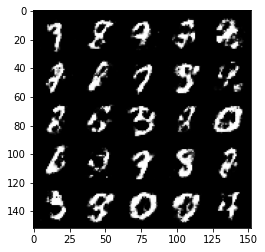

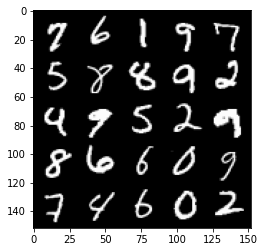

 63%|██████▎   | 297/469 [00:05<00:03, 56.70it/s]

Step 88000: Generator loss: 1.208872488260269, discriminator loss: 0.5131798047423362


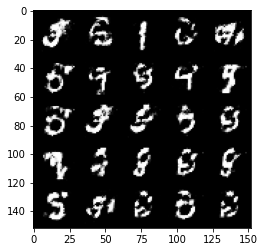

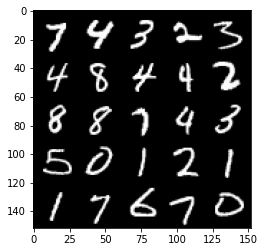

 70%|██████▉   | 326/469 [00:05<00:02, 55.60it/s]

Step 88500: Generator loss: 1.255093395233155, discriminator loss: 0.48760130977630617


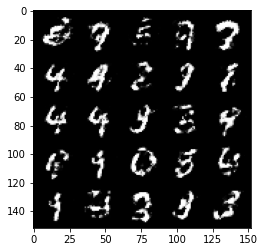

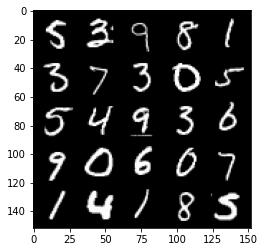

 76%|███████▌  | 356/469 [00:06<00:02, 54.30it/s]

Step 89000: Generator loss: 1.290654016494752, discriminator loss: 0.47875404942035676


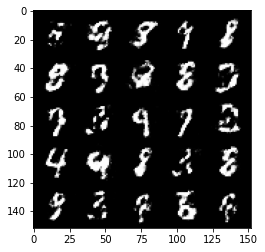

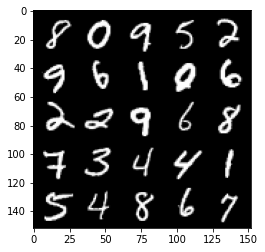

 83%|████████▎ | 389/469 [00:06<00:01, 62.04it/s]

Step 89500: Generator loss: 1.241213326215743, discriminator loss: 0.4921266992092133


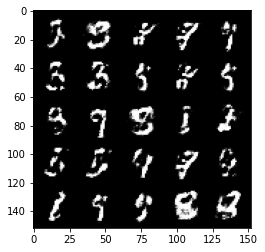

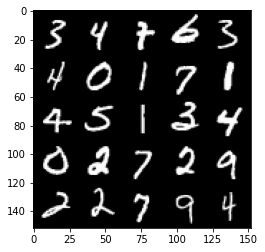

 89%|████████▉ | 417/469 [00:07<00:01, 50.92it/s]

Step 90000: Generator loss: 1.2318442702293395, discriminator loss: 0.49146982175111764


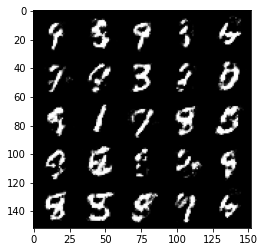

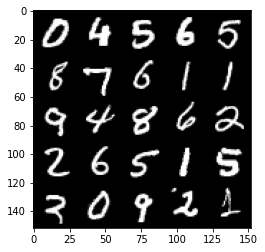

 96%|█████████▌| 451/469 [00:08<00:00, 54.60it/s]

Step 90500: Generator loss: 1.3696478266716021, discriminator loss: 0.43842491412162793


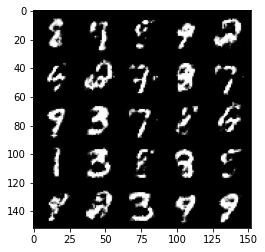

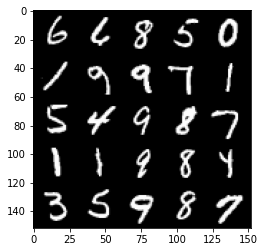

  2%|▏         | 11/469 [00:00<00:09, 50.31it/s]

Step 91000: Generator loss: 1.2252599320411677, discriminator loss: 0.5031009835004806


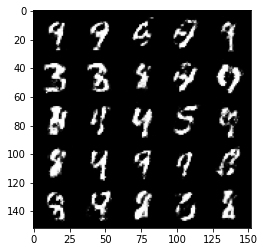

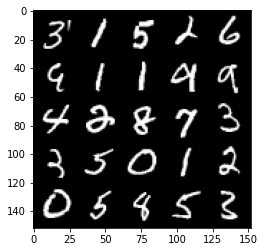

  9%|▉         | 42/469 [00:00<00:07, 53.47it/s]

Step 91500: Generator loss: 1.2399593222141259, discriminator loss: 0.48697722840309143


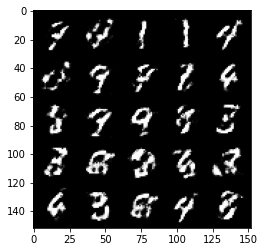

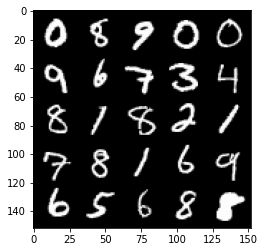

 15%|█▌        | 71/469 [00:01<00:07, 52.17it/s]

Step 92000: Generator loss: 1.2948958013057714, discriminator loss: 0.48941817027330425


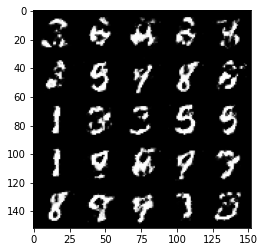

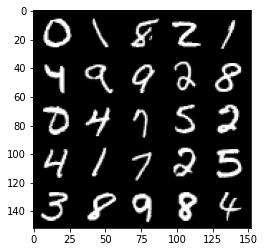

 22%|██▏       | 103/469 [00:01<00:06, 54.14it/s]

Step 92500: Generator loss: 1.2295266146659853, discriminator loss: 0.48610409349203093


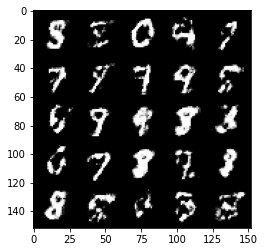

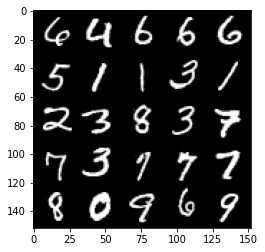

 29%|██▊       | 134/469 [00:02<00:06, 55.49it/s]

Step 93000: Generator loss: 1.2006593801975245, discriminator loss: 0.49475148987770085


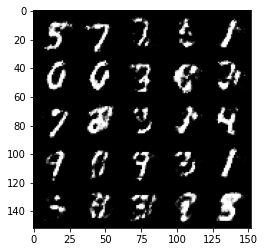

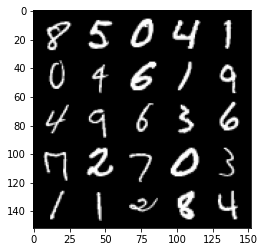

 35%|███▍      | 164/469 [00:03<00:05, 51.34it/s]

Step 93500: Generator loss: 1.2411732931137096, discriminator loss: 0.4757607759237286


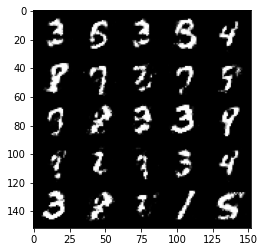

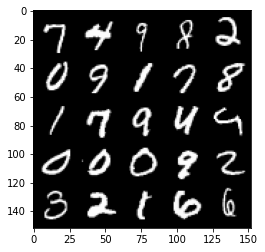

100%|██████████| 469/469 [00:09<00:00, 52.07it/s]


In [27]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        #### END CODE HERE ####
        
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        
        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1